**CAP 4773: Homework Assignment 8**

**Due on Canvas by Monday, December 1, 2025 at 11:59pm**



**Place name here:** Nathan LaBar

**Preliminary instructions**

All analyses must be performed in Python using only the **`plotnine`**, **`tidypandas`**, **`statsmodels.api`**, and **`sklearn`** libraries that we discussed in class. You may *not* use **`pandas`**, **`matplotlib`**, or **`seaborn`**. The only exception is that **`pandas`** may only be used to read an input file for your dataset. Fill in all your solutions in the appropriate text or code cells provided in this Python notebook, and then upload a HTML-converted copy of your Python notebook solution to Canvas. **Only HTML copies of this notebook will be graded.** Instructions on how to convert Python notebooks to HTML in Google Colab are provided at the bottom of this assignment.

Install all libraries and necessary dependencies below.

In [ ]:
pip install --quiet plotnine[all] tidypandas numpy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.2/85.2 kB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.9/52.9 kB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.9/64.9 kB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.1/88.1 kB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 183.0/183.0 kB 12.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 226.4/226.4 kB 12.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.7/42.7 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 252.3/252.3 kB 13.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 150.7/150.7 kB 9.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 kB 6.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.5/3.5 MB 64.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.8/50.8 kB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.0/6.0 

Load all necessary libraries below.

In [ ]:
import numpy
from plotnine import *
from tidypandas import tidyframe
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import ElasticNet
from sklearn.decomposition import PCA


In [ ]:
pip install statsmodels


In [ ]:
import statsmodels.api as sm

**Brief overview of assignment**

In this assignment you will be tasked with identifying a dataset from an external source, and apply visualization, transformation, and supervised and unsupervised modeling to your identified dataset. You will also need to effectively communicate your findings.

There are many websites that you can obtain datasets suitable for analysis. One such site is kaggle: **`https://www.kaggle.com/datasets`**.

You may of course use other reputable sites to obtain your dataset, but you may not use a dataset that we have already covered in class, either during lecture or in the homework assignments.

**Grading**

Grading will be based on adherenence to formatting and content requirements, as well as on effective communication. Points will be deducted for any perceived attempts to circumvent requirements. Ensure that all visualizations are clear and of professional quality, noting that all axes must be labeled in detail. A key goal of this final assignment is to effectively communicate findings, and visualization can impart the opposite effect if it is unclear.

**1. [5%]** Provide the name and website address of the dataset that you chose to analyze.

**Provide response here:**

Spotify Tracks DB

https://www.kaggle.com/datasets/zaheenhamidani/ultimate-spotify-tracks-db

**2. [5%]** Provide code to import your dataset and store as a data frame below, and describe your dataset in terms of the number of observations, number of features, and the number of each type of feature (*e.g.*, categorical and continuous).

In [ ]:
import pandas

SpotifyTracks = pandas.read_csv("/content/SpotifyFeatures.csv")

SpotifyTracks

,genre,artist_name,track_name,track_id,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence
0,Movie,Henri Salvador,C'est beau de faire un Show,0BRjO6ga9RKCKjfDqeFgWV,0,0.61100,0.389,99373,0.910,0.000000,C#,0.3460,-1.828,Major,0.0525,166.969,4/4,0.814
1,Movie,Martin & les fées,Perdu d'avance (par Gad Elmaleh),0BjC1NfoEOOusryehmNudP,1,0.24600,0.590,137373,0.737,0.000000,F#,0.1510,-5.559,Minor,0.0868,174.003,4/4,0.816
2,Movie,Joseph Williams,Don't Let Me Be Lonely Tonight,0CoSDzoNIKCRs124s9uTVy,3,0.95200,0.663,170267,0.131,0.000000,C,0.1030,-13.879,Minor,0.0362,99.488,5/4,0.368
3,Movie,Henri Salvador,Dis-moi Monsieur Gordon Cooper,0Gc6TVm52BwZD07Ki6tIvf,0,0.70300,0.240,152427,0.326,0.000000,C#,0.0985,-12.178,Major,0.0395,171.758,4/4,0.227
4,Movie,Fabien Nataf,Ouverture,0IuslXpMROHdEPvSl1fTQK,4,0.95000,0.331,82625,0.225,0.123000,F,0.2020,-21.150,Major,0.0456,140.576,4/4,0.390
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
232720,Soul,Slave,Son Of Slide,2XGLdVl7lGeq8ksM6Al7jT,39,0.00384,0.687,326240,0.714,0.544000,D,0.0845,-10.626,Major,0.0316,115.542,4/4,0.962
232721,Soul,Jr Thomas & The Volcanos,Burning Fire,1qWZdkBl4UVPj9lK6HuuFM,38,0.03290,0.785,282447,0.683,0.000880,E,0.2370,-6.944,Minor,0.0337,113.830,4/4,0.969
232722,Soul,Muddy Waters,(I'm Your) Hoochie Coochie Man,2ziWXUmQLrXTiYjCg2fZ2t,47,0.90100,0.517,166960,0.419,0.000000,D,0.0945,-8.282,Major,0.1480,84.135,4/4,0.813
232723,Soul,R.LUM.R,With My Words,6EFsue2YbIG4Qkq8Zr9Rir,44,0.26200,0.745,222442,0.704,0.000000,A,0.3330,-7.137,Major,0.1460,100.031,4/4,0.489


**Provide response here:**

232725 observations and 18features.

Categorical features: track_id, artist_name, track_name, genre

The rest are continous


**3. [40%]** Explore your dataset, which includes visualization, transformation, and modeling to uncover patterns and generate testable hypotheses. Add as many code and text boxes below to demonstrate a rigorous, open-ended exploration of your dataset. You must apply visualization, transformation, and modeling at least once here during your exploration, and in at least three separate stages (*e.g.*, it is not an exploration if you peform transformation and visualization together without visualizing your dataset before transformation). Note that credit will be based on how comprehensive you are in your exploration.

/usr/local/lib/python3.12/dist-packages/tidypandas/tidy_utils.py:211: FutureWarning: RangeIndex.is_numeric is deprecated. Use pandas.api.types.is_any_real_numeric_dtype instead


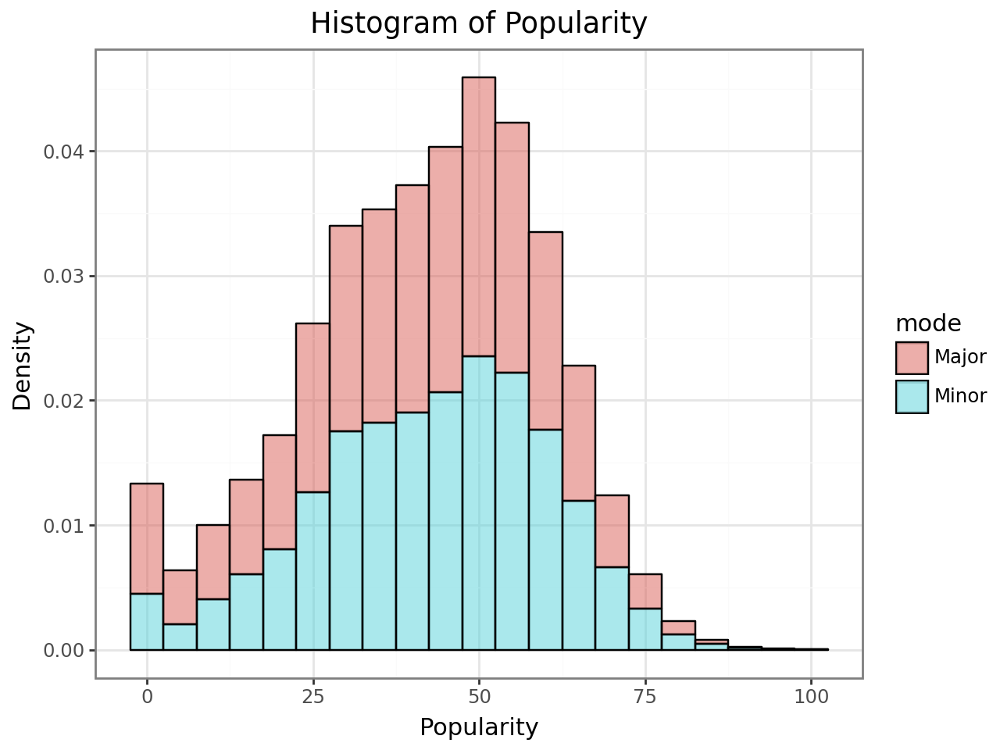

In [ ]:
#Histogram of popularity

tidySpotifyTracks = tidyframe(SpotifyTracks)

histo_plot_mode = (ggplot(data = tidySpotifyTracks, mapping = aes(x = "popularity", fill = "mode")) +
  geom_histogram(mapping = aes(y = "stat(density)"),
                 color = "black",
                 alpha = 0.5,
                 binwidth = 5)
  + labs (
      title = "Histogram of Popularity",
      x = "Popularity",
      y = "Density"
  )
  + theme_bw()
)

histo_plot_key = (ggplot(data = tidySpotifyTracks, mapping = aes(x = "popularity", fill = "key")) +
  geom_histogram(
                 color = "black",
                 alpha = 0.5,
                 binwidth = 5
                 )
  + labs (
      title = "Histogram of Popularity",
      x = "Popularity",
      y = "Count"
  )
  + theme_bw()
)

tidy_no0 = tidySpotifyTracks.filter("time_signature in ['1/4','2/4', '3/4', '4/4', '5/4']")

histo_plot_time_sig = (ggplot(data = tidy_no0, mapping = aes(x = "popularity", fill = "time_signature")) +
  geom_histogram(
                 alpha = 0.5,
                 binwidth = 5)
  + labs (
      title = "Histogram of Popularity",
      x = "Popularity",
      y = "Count"
  )
  + theme_bw()
)

histo_plot_mode

From this histogram and the dataset it appears that not only are more songs written in major scale, but they are more popular than their minor counterparts.

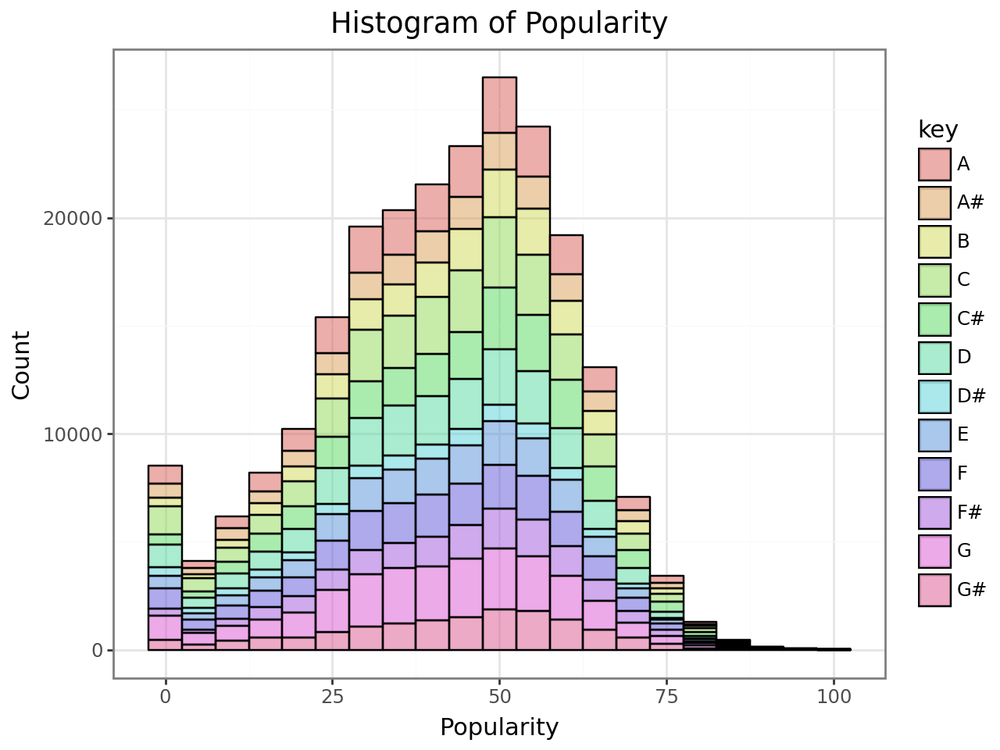

In [ ]:
histo_plot_key

This histogram shows that songs played in the A and A# key are the most popular and most written

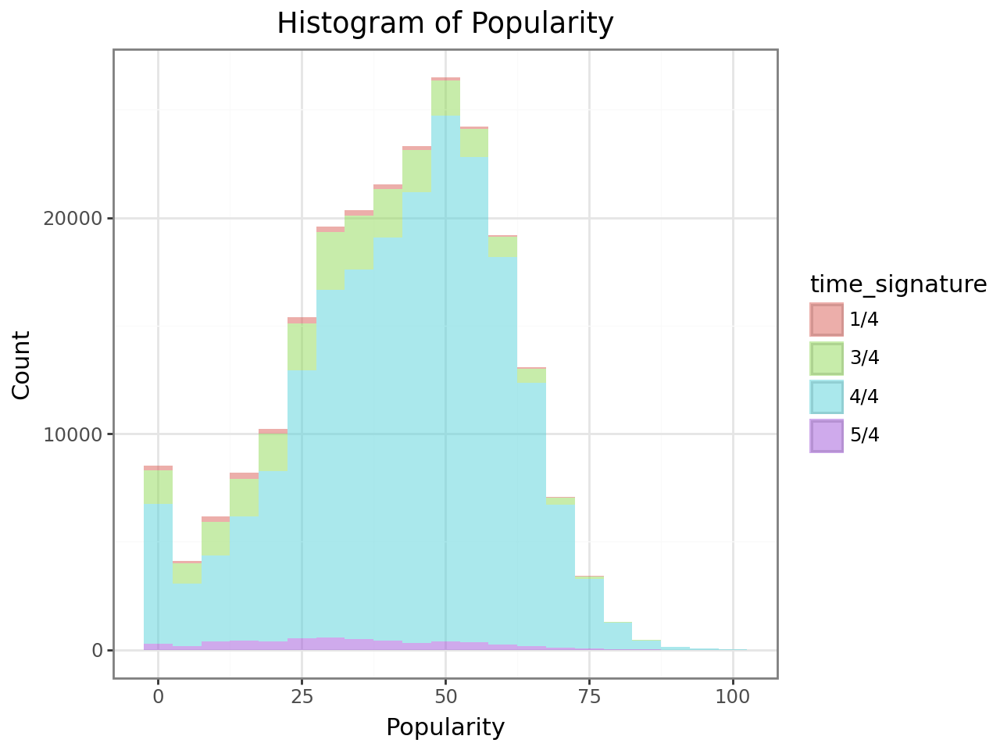

In [ ]:
histo_plot_time_sig

Upon further research, 1/4 is not common so the fact that it tops out above3/4 seems to be an anomaly/artifact in the way that spotify labels time_signatures. What is important to note is that 3/4 and 5/4 are the most popular otherwise. I filtered out 0/4 because those are songs that spotify could not identify the time signature so that could also being affecting this visualization (for example songs that should be classified as 4/5 or 5/4 not being displayed here)


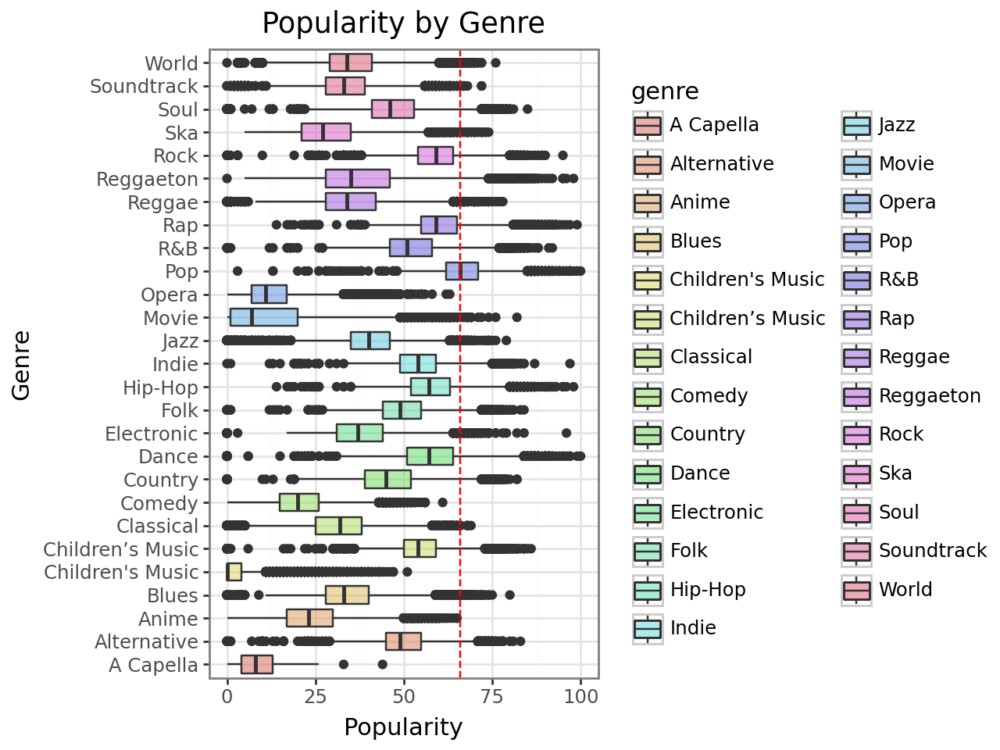

In [ ]:

#I looked through the notes and could not find a good way to store a median value like this
#I just wanted to display a line through the median of the most popular category which was pop
median_pop = (
    tidySpotifyTracks.filter("genre == 'Pop'")
    .pull("popularity")
    .median()
)

popularity_by_genre = (ggplot(
    data = tidySpotifyTracks, mapping = aes(x = "genre", y = "popularity", fill = "genre")
    )
+ geom_boxplot(
    alpha = 0.5
)
+ geom_hline(
    yintercept = median_pop,
    color = "red",
    linetype = "dashed"
)
+ theme_bw()
+ labs(
    title = "Popularity by Genre",
    x = "Genre",
    y = "Popularity"
)
+coord_flip()
)

popularity_by_genre

This Visualization appears to be one of the most informative. The most popular genres are pop, rap, rock, hiphop, and dance

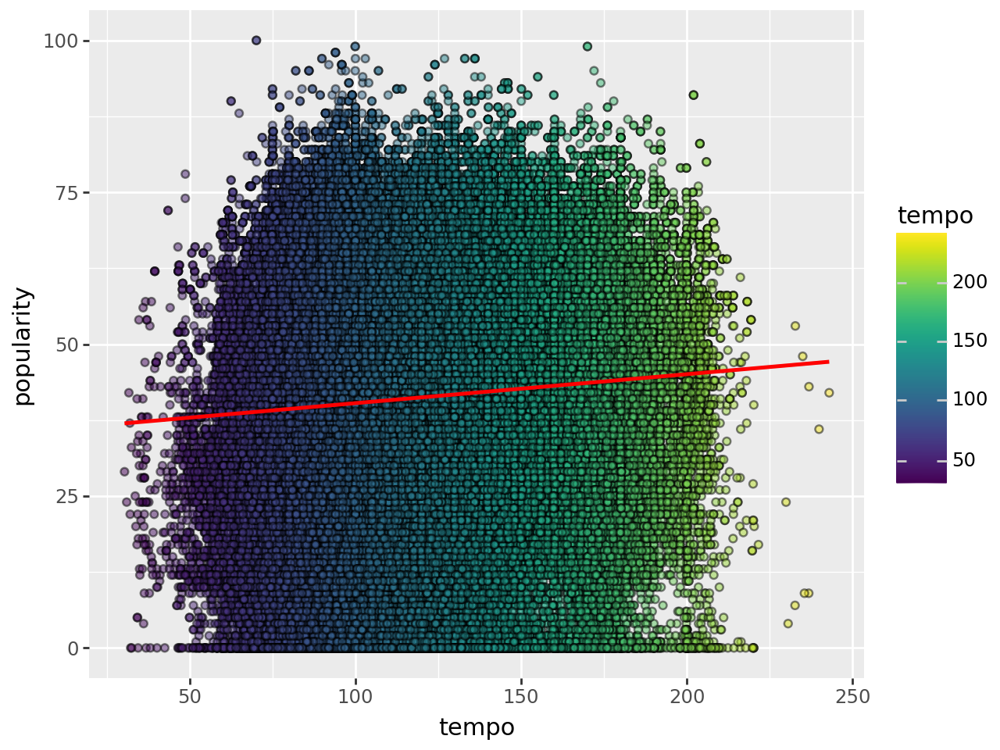

In [ ]:
scatter_tempo = (
    ggplot(data = tidySpotifyTracks,
           mapping = aes(x = 'tempo', y = 'popularity'))
    + geom_point(mapping = aes(fill = 'tempo'), alpha = 0.5)
    + geom_smooth(method = 'lm', color = 'red')
)
scatter_tempo

Before transformig the data it appears that higher tempos = higher popularity.

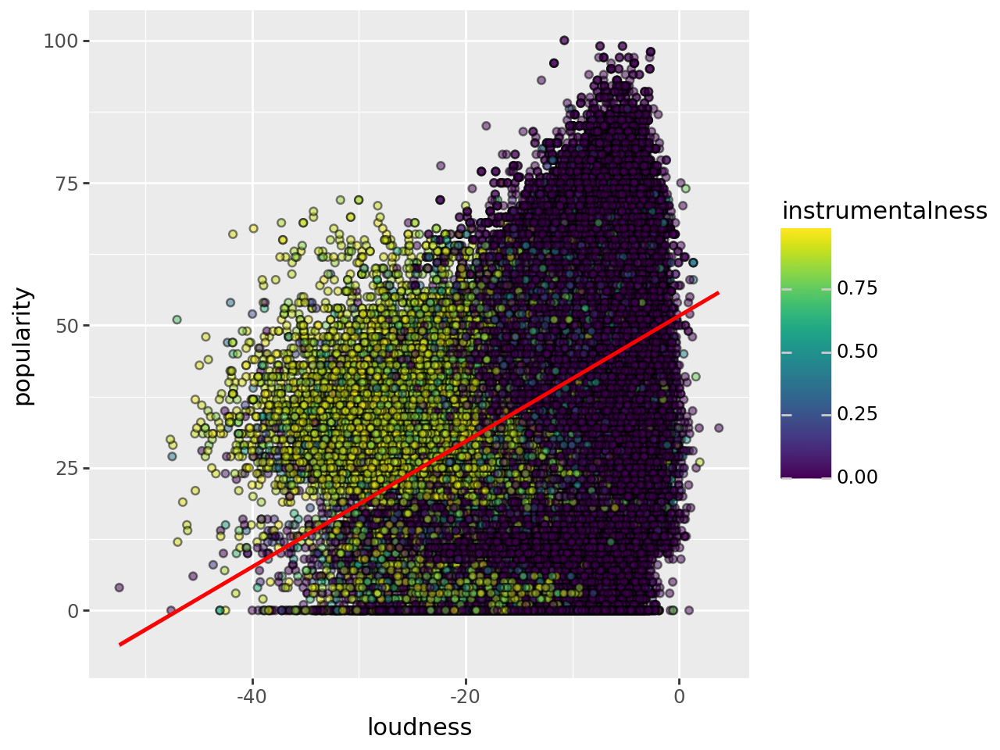

In [ ]:
scatter_loudness = (
    ggplot(data = tidySpotifyTracks,
           mapping = aes(x = 'loudness', y = 'popularity'))
    + geom_point(mapping = aes(fill = 'instrumentalness'), alpha = 0.5)
    + geom_smooth(method = 'lm', color = 'red')
)
scatter_loudness

This is interesting because it seems the more popular songs are more instrumental but louder than ones that are not.

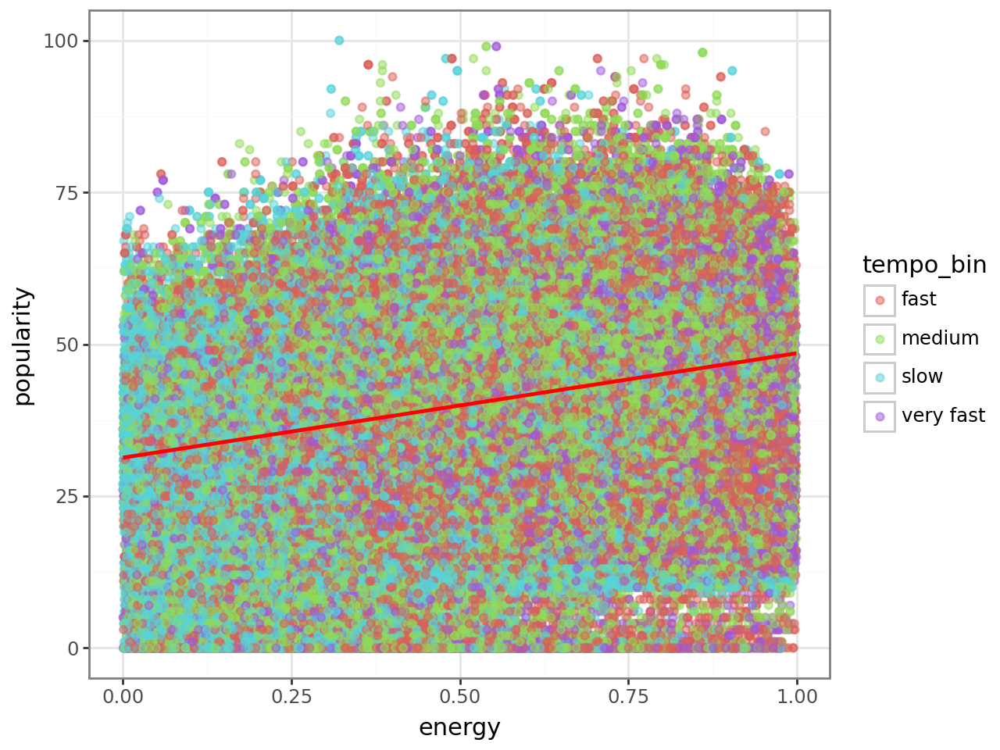

In [ ]:
num_features = tidySpotifyTracks.select([
    'tempo','acousticness','danceability','energy',
    'instrumentalness','liveness','loudness','speechiness','valence'
])

# Define a simple function to bin tempo manually
#The point of the function is to set a range for tempo as slow medium fast or very fast
#to compare popularity between them on a categorical scale
def tempo_bins(tempo_series):
    # Create a list to hold bin labels
    bins = []
    for t in tempo_series:
        if t <= 90:
            bins.append('slow')
        elif t <= 120:
            bins.append('medium')
        elif t <= 150:
            bins.append('fast')
        else:
            bins.append('very fast')
    return bins

tf = tidySpotifyTracks
feat_engineered = tf.mutate({
    'abs_loudness' : lambda tf : tf['loudness'].abs(),
    'tempo_bin' : lambda tf: tempo_bins(tf['tempo'])
})

scatter_energy = (
    ggplot(data = feat_engineered,
           mapping = aes(x = "energy", y = "popularity", color = "tempo_bin")
    )
    + geom_point(alpha = 0.5)
    + geom_smooth(method = "lm", color = 'red')
    + theme_bw()
)

scatter_dance = (
    ggplot(feat_engineered, aes(x='danceability', y='popularity', color = "tempo_bin")) +
    geom_point(alpha=0.3) +
    geom_smooth(method='lm', color='red') +
    labs(title='Danceability vs Popularity')
)
scatter_energy

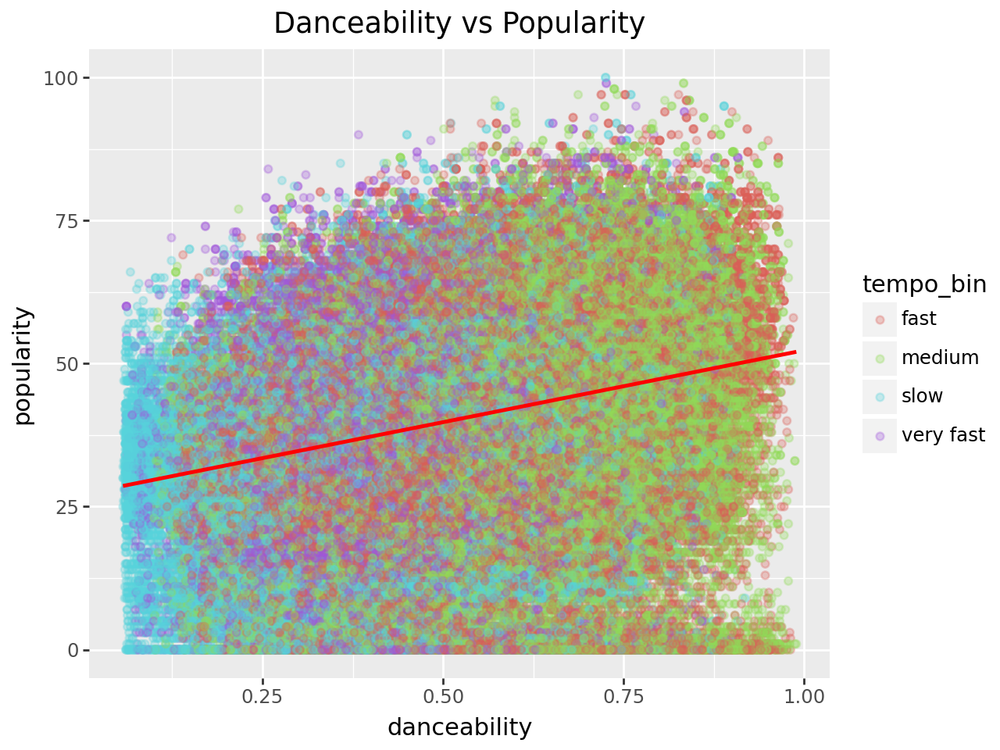

In [ ]:
scatter_dance

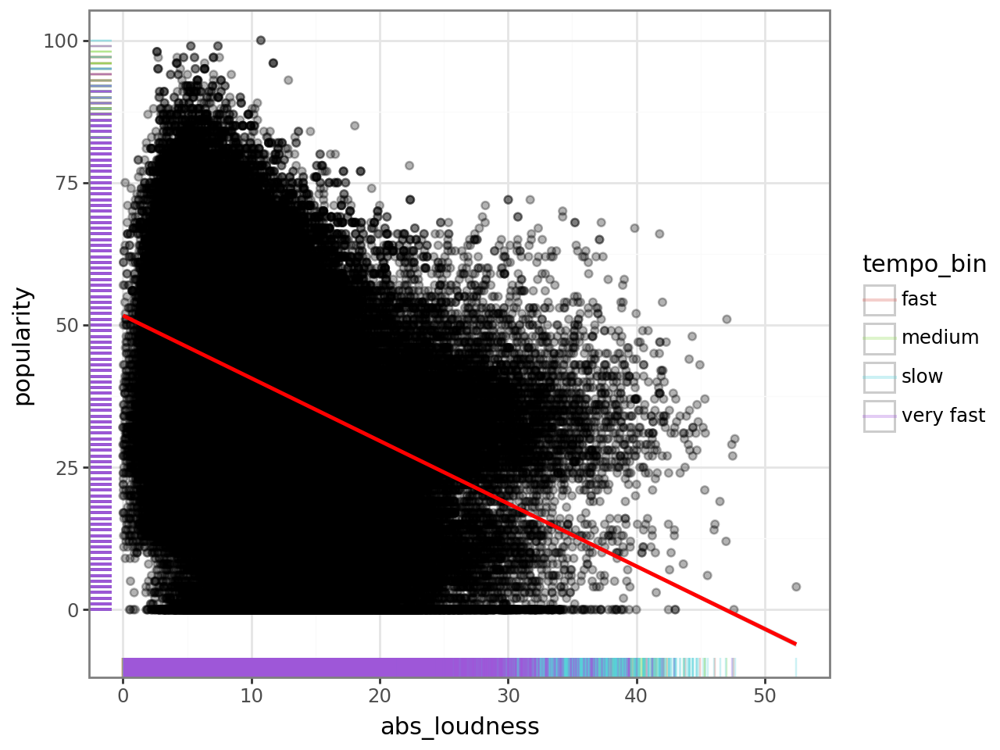

In [ ]:

#tracks actually closer to 0 are much louder since spotify originally tracks
#these values in negative decibels

scatter_loud = (
    ggplot(feat_engineered, aes(x='abs_loudness', y='popularity'))
    + geom_point(alpha=0.3)
    + geom_smooth(method='lm', color='red')
    + geom_rug(mapping = aes(color = 'tempo_bin'), alpha = 0.3)
    + theme_bw()
)
scatter_loud

I enjoyed creating these scatter plots and I believe they gave me a lot of information that makes sense. Generally music with more energy is more popular and music with more energy tends to be of a faster tempo. However the danceability plot shows that danceability is also important to popularity and very fast songs are not as danceable. Medium and fast tempo songs tend to be the most danceable. Then the absolute value of loudness plot shows that the very fast tempo songs tend to be the loudest (spotify originally has these as negative values so the greater values are quieter songs) and louder songs tend to be more popular as well.

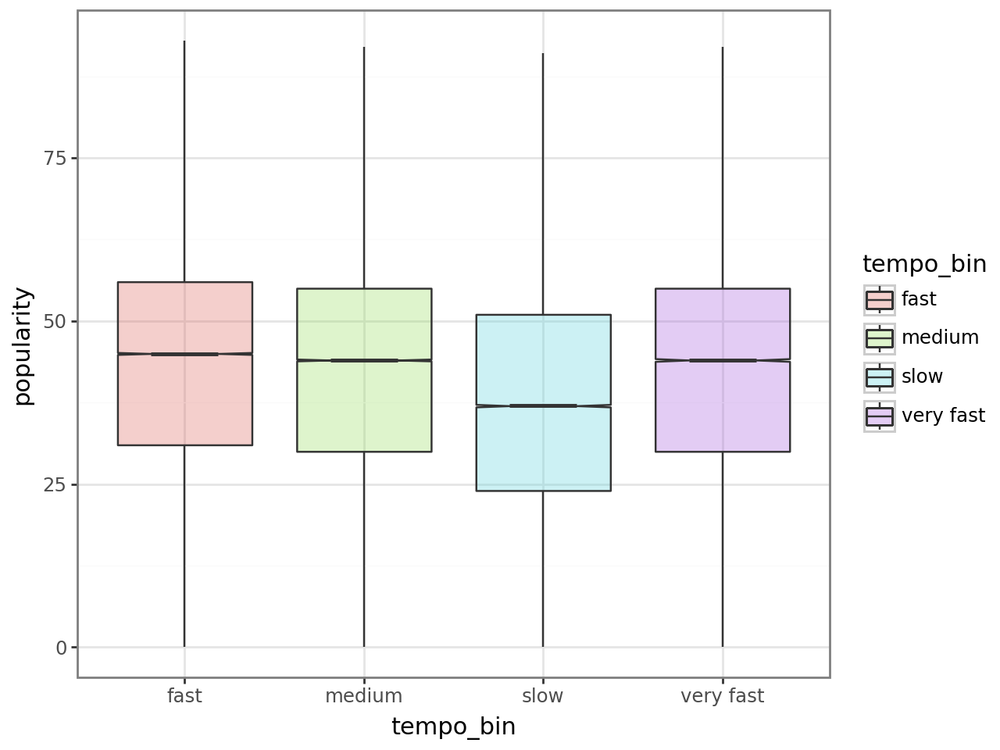

In [ ]:
box_tempo = (
    ggplot(feat_engineered, aes(x='tempo_bin', y='popularity', fill = 'tempo_bin'))
    + geom_boxplot(alpha=0.3, outlier_shape = None, notch = True)
    + theme_bw()
)
box_tempo

This box plot shows that fast tempo songs are the most popular and slow is by far the least popular.

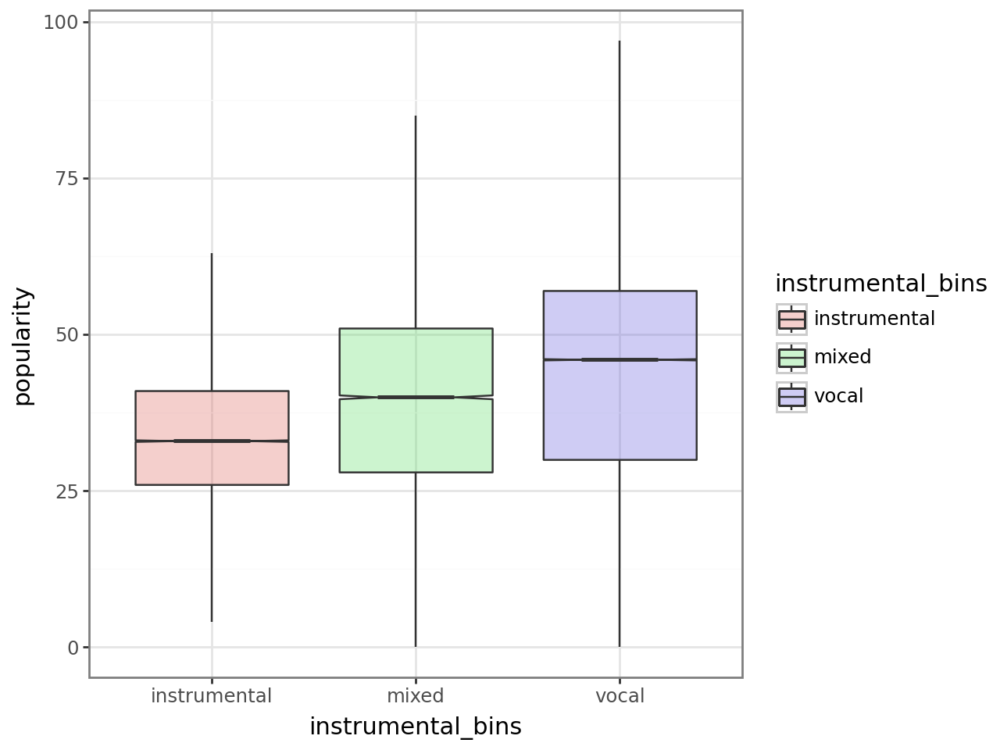

In [ ]:
def instrumental_bins(instrumentalness_series):
    # Create a list to hold bin labels
    cat = []
    for t in instrumentalness_series:
        if t <= 0.1:
          cat.append('vocal')
        elif t <= 0.5:
          cat.append('mixed')
        else:
          cat.append('instrumental')
    return cat

inst_tf = tf.mutate({
    'instrumental_bins' : lambda tf: instrumental_bins(tf['instrumentalness'])
})

inst_plot = (
    ggplot(inst_tf,
          mapping = aes(x = 'instrumental_bins', y = 'popularity', fill = 'instrumental_bins'))
        + geom_boxplot(alpha = 0.3, outlier_shape = None, notch = True)
        + theme_bw()
    )

inst_plot


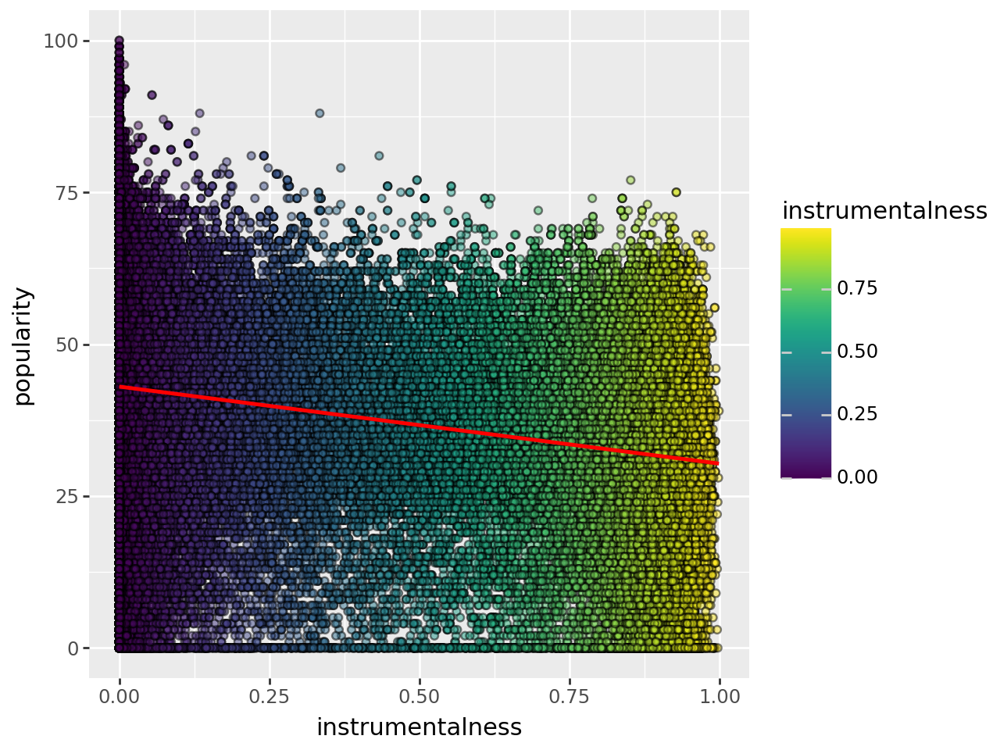

In [ ]:
scatter_instr = (
    ggplot(data = tidySpotifyTracks,
           mapping = aes(x = 'instrumentalness', y = 'popularity'))
    + geom_point(mapping = aes(fill = 'instrumentalness'), alpha = 0.5)
    + geom_smooth(method = 'lm', color = 'red')
)
scatter_instr

More vocally oriented songs are more popular, and I believe this to be the most damning evidence/correlation especially due to the difference in the box plots


**4. [40%]** Now that you've explored your dataset, embark on some additional modeling. You must perform at least one hypothesis test, supervised predictive modeling, and unsupervised learning to understand the structure of your dataset. For the hypothsis testing, you must clearly state your hypothesis or hypotheses (null and alternative hypotheses), the statistical tests used to asses your hypothesis or hypotheses, and what the conclusions are of the hypothesis test or tests. This will also include what the response variable is, and why you used specific modeling frameworks for the nature of this output variable. Add as many code and text boxes below as necessary for each hypothesis test, supervised predictive modeling, and unsupervised learning analysis, where each analysis must include a text description and conclusions drawn from it. Ensure that where appropriate, visualizations are included (see prior homework assignments and lecture notes for examples). Note that credit will be based on how comprehensive you are in your analysis and written conclusions.

#Hypothesis'

I hypothesize that songs that are vocal (low instrumentalness), have a medium–fast tempo, are highly danceable, and are loud tend to be more popular.

##Hypothesis for Instrumentalness

Null hypothesis: Instrumentalness has no correlation to popularity

Alternative hypothesis: Instrumentalness has negative correlation to popularity (vocal songs are more popular)

##Hypothesis for Tempo

Null Hypothesis: Tempo has no relationship with popularity

Alternative: Medium and Fast tempos have higher average popularity than slow or very fast tempos

##Hypothesis for Danceability

Null Hypothesis: Danceability is not related to popularity

Alternative: Danceability has a positive correlation with popularity

##Hypothesis for Loudness

Null Hypothesis: Loudness is not associated with popularity

Alternative: Loudness has a positive association with popularity

I am going to utilize Multinomial Linear Regression since my hypothesis is that instrumentalness, tempo, danceability, and loudness determine a songs popularity. I will be predicting a numeric value representing popularity 0-100 which is continuous. However I will first test to see how many features are correlated to the response.

In [ ]:


X = (tidySpotifyTracks.select([
    'tempo','acousticness','danceability','energy',
    'instrumentalness','liveness','loudness','speechiness','valence'
]).to_pandas())
Y = tidySpotifyTracks.select('popularity').to_pandas()
X_with_ones = sm.add_constant(X)
lm_fit = sm.OLS(Y, X_with_ones).fit()
lm_fit.pvalues


,0
const,0.000000e+00
tempo,5.567405e-05
acousticness,0.000000e+00
danceability,0.000000e+00
energy,1.003144e-89
instrumentalness,6.539630e-226
liveness,0.000000e+00
loudness,0.000000e+00
speechiness,1.777465e-272
valence,0.000000e+00


According to the p-values all of the features are related to the response. There are extremely small p values for energy, instrumentalness and speechiness which indicates a strong statistical relationship between these features and the response variable. Values that appear to be at 0 (acousticness, tempo, danceability, liveness, loudness, and valence) are also highly significant predictors, python just rounded down to 0 due to how small the number was

In [ ]:
hyp_feat = ['instrumentalness', 'tempo', 'danceability', 'loudness']

tf_model = tf.select(hyp_feat + ['popularity'])

y = tf_model.select('popularity').to_pandas()
X = tf_model.select(hyp_feat).to_pandas()

x_with_ones = sm.add_constant(X)
model = sm.OLS(y, x_with_ones)
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             popularity   R-squared:                       0.144
Model:                            OLS   Adj. R-squared:                  0.144
Method:                 Least Squares   F-statistic:                     9764.
Date:                Fri, 28 Nov 2025   Prob (F-statistic):               0.00
Time:                        16:39:26   Log-Likelihood:            -9.8727e+05
No. Observations:              232725   AIC:                         1.975e+06
Df Residuals:                  232720   BIC:                         1.975e+06
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               43.0047      0.227    189.366      0.000      42.560      43.450
instrumentalness    -0.8322      0.136     -6.121      0.000      -1.099      -0.566
tempo                0.0047      0.001      4.052      0.000       0.002       0.007
danceability        11.6465      0.214     54.506      0.000      11.228      12.065
loudness             0.9159      0.007    125.609      0.000       0.902       0.930
==============================================================================
Omnibus:                     6064.448   Durbin-Watson:                   0.309
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             6326.205
Skew:                          -0.388   Prob(JB):                         0.00
Kurtosis:                       2.777   Cond. No.                     1.01e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.01e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [ ]:
#genre	artist_name	track_name	track_id	popularity	acousticness	danceability
#duration_ms	energy	instrumentalness	key	liveness	loudness	mode	speechiness	tempo	time_signature	valence

#Elastic Net Regression Model
tidySpotifyTraining = (
    tidySpotifyTracks
        .mutate({"rand": numpy.random.rand(tidySpotifyTracks.shape[0])})
)
#get random test and training data
train_tf = tidySpotifyTraining.filter("rand < 0.8")
test_tf  = tidySpotifyTraining.filter("rand >= 0.8")

X_train = train_tf.select(["popularity", "genre", "artist_name", "track_name", "track_id", "key", "mode", "time_signature", "rand" ], include=False).to_pandas()
X_test = test_tf.select(["popularity", "genre", "artist_name", "track_name", "track_id", "key", "mode", "time_signature", "rand"], include=False).to_pandas()

y_train = train_tf.select("popularity").to_pandas().iloc[:, 0]
y_test = test_tf.select("popularity").to_pandas().iloc[:, 0]


lambdas = 10**numpy.linspace(start = -6, stop = 6, num = 11)
alphas = numpy.linspace(start = 0, stop = 1, num = 11)
scaler = StandardScaler(with_mean = True, with_std = True)
enet = ElasticNet(alpha = lambdas, l1_ratio = alphas)
pipe = Pipeline(steps = [("scaler", scaler),
                         ("enet", enet)])
param_grid = {"enet__alpha" : lambdas,
              "enet__l1_ratio" : alphas}
grid = GridSearchCV(pipe, param_grid, cv = 5, scoring = "neg_mean_squared_error")
grid.fit(X_train, y_train)


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.904e+07, tolerance: 5.259e+03 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.683e+07, tolerance: 4.337e+03 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
/usr/local/lib/pyt

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('enet',
                                        ElasticNet(alpha=array([1.00000000e-06, 1.58489319e-05, 2.51188643e-04, 3.98107171e-03,
       6.30957344e-02, 1.00000000e+00, 1.58489319e+01, 2.51188643e+02,
       3.98107171e+03, 6.30957344e+04, 1.00000000e+06]),
                                                   l1_ratio=array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ])))]),
             param_grid={'enet__alpha': array([1.00000000e-06, 1.58489319e-05, 2.51188643e-04, 3.98107171e-03,
       6.30957344e-02, 1.00000000e+00, 1.58489319e+01, 2.51188643e+02,
       3.98107171e+03, 6.30957344e+04, 1.00000000e+06]),
                         'enet__l1_ratio': array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ])},
             scoring='neg_mean_squared_error')

/usr/local/lib/python3.12/dist-packages/tidypandas/tidy_utils.py:211: FutureWarning: RangeIndex.is_numeric is deprecated. Use pandas.api.types.is_any_real_numeric_dtype instead


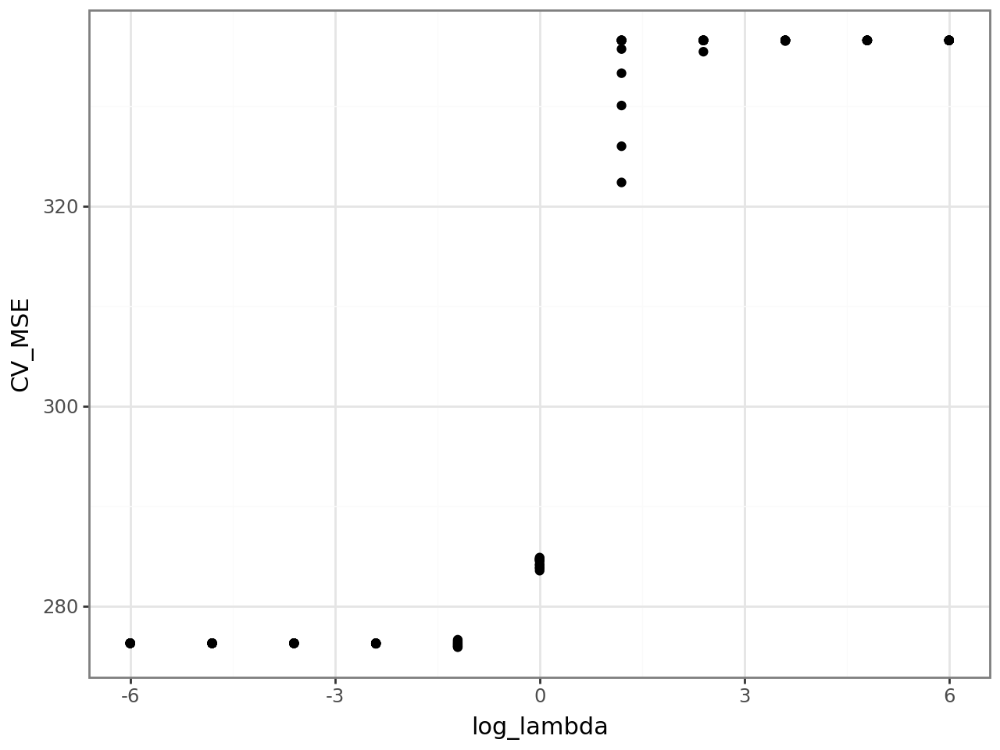

In [ ]:
results_tf = tidyframe({
    "log_lambda": numpy.log10(grid.cv_results_["param_enet__alpha"].data),
    "l1_ratio": grid.cv_results_["param_enet__l1_ratio"].data,
    "CV_MSE": -grid.cv_results_["mean_test_score"]
})


cv_plot = (
    ggplot(data=results_tf, mapping=aes(x="log_lambda", y="CV_MSE"))
    + geom_point()
    + theme_bw()
)
cv_plot


In [ ]:
grid.best_params_

{'enet__alpha': np.float64(0.0630957344480193),
 'enet__l1_ratio': np.float64(0.0)}

The grid search determined that the best model utilizes ridge regression with mild regularization which means that as mentioned earlier, all features contribute to the predictions but the regularization improves generalization. This is shown both by the CV error being lowest between 0 and -3 and by the grid.best_params_ being a low number



In [ ]:
best_pipe = grid.best_estimator_
best_model = best_pipe.named_steps["enet"]
best_model.coef_

array([-3.83707303,  3.09075708,  0.30296031, -0.72606471, -1.37062332,
       -1.93277169,  3.62443465, -1.55834743, -0.09917377, -3.09955567])

Tempo, Acousticness, energy, instrumentalness, liveness and valence all contribute negative to popularity while danceability and loudness contribute positively to popularity.
tempo','acousticness','danceability','energy','instrumentalness',
'liveness','loudness','speechiness','valence'

/usr/local/lib/python3.12/dist-packages/tidypandas/tidy_utils.py:211: FutureWarning: RangeIndex.is_numeric is deprecated. Use pandas.api.types.is_any_real_numeric_dtype instead


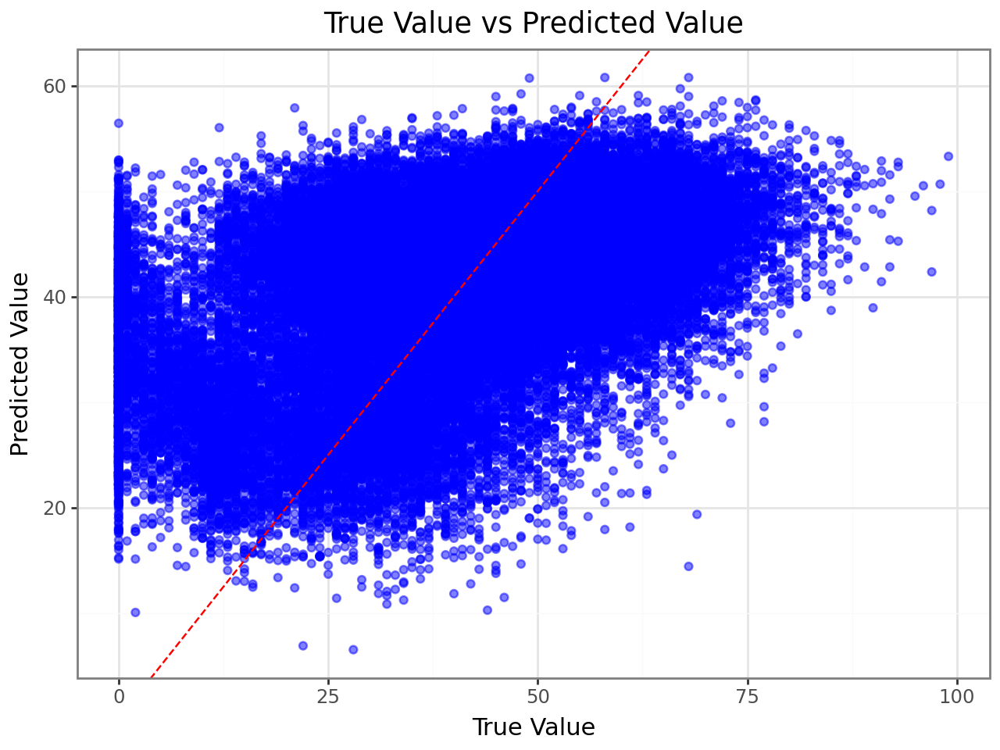

In [ ]:
preds = best_pipe.predict(X_test)
preds

results = tidyframe({
    "true_value": y_test,
    "preds": preds
})

tf_count = results.count(["true_value", "preds"])

res_plot = (
    ggplot(
        data = tf_count,
        mapping = aes(x = "true_value", y = "preds")
    )
    + geom_point(color = "blue", alpha = 0.5)
    + geom_abline(intercept = 0, slope = 1, linetype = 'dashed', color = 'red')
    + theme_bw()
    +labs(
        title = "True Value vs Predicted Value",
        x = "True Value",
        y = "Predicted Value"
  )
)

res_plot

So based on this my model is not great at predicting if a song will be popular and I think thats heavily due to each song being different. Just because a song is slow or you cannot dance to it does not mean the song will not be popular. There could also be categorical features I ignored in this model such as time_signature that contribute more to the response


#Now I am Going to Try an Unsupervised Model

In [ ]:

#genre	artist_name	track_name	track_id	popularity	acousticness	danceability
#duration_ms	energy	instrumentalness	key	liveness	loudness	mode	speechiness	tempo	time_signature	valence

SpotifyTF = tidyframe(SpotifyTracks)

# Separate label columns (song names, artist) from features but also hold on to labels turned into numbers to add back later
labels = SpotifyTracks[['artist_name', 'track_name', 'track_id']]
labels_ext = SpotifyTracks[['artist_name', 'track_name', 'track_id', 'genre', 'mode', 'time_signature']]

#I looked through the notes on how to turn qualitative features into quantitative but I could not find example code
numeric_cols = SpotifyTracks.select_dtypes(include=[numpy.number]).columns.tolist()
cat_cols = SpotifyTracks.select_dtypes(include=["object", "category"]).columns.tolist()

# Remove label columns from categorical
cat_cols = [col for col in cat_cols if col not in labels.columns]

#One-hot encode categorical features is what I found to use all features
Spotify_features = pandas.get_dummies(SpotifyTracks[numeric_cols + cat_cols], drop_first=False)


scaler = StandardScaler()
spot_scaled = scaler.fit_transform(Spotify_features)

pca = PCA(n_components=2)
pca.fit(spot_scaled)

Z = pandas.DataFrame(pca.transform(spot_scaled), columns=['PC1', 'PC2'])
Z = pandas.concat([Z, labels_ext.reset_index(drop = True)], axis=1)
Z_tf = tidyframe(Z)
Z_tf




/usr/local/lib/python3.12/dist-packages/tidypandas/tidy_utils.py:211: FutureWarning: RangeIndex.is_numeric is deprecated. Use pandas.api.types.is_any_real_numeric_dtype instead
/usr/local/lib/python3.12/dist-packages/tidypandas/tidy_utils.py:211: FutureWarning: RangeIndex.is_numeric is deprecated. Use pandas.api.types.is_any_real_numeric_dtype instead
/usr/local/lib/python3.12/dist-packages/tidypandas/format.py:166: FutureWarning: Index.format is deprecated and will be removed in a future version. Convert using index.astype(str) or index.map(formatter) instead.


,PC1,PC2,artist_name,track_name,track_id,genre,mode,time_signature
,<float64>,<float64>,<object>,<object>,<object>,<object>,<object>,<object>
0,0.504339,1.124591,Henri Salvador,C'est beau de faire un Show,0BRjO6ga9RKCKjfDqeFgWV,Movie,Major,4/4
1,0.893636,0.599548,Martin & les fées,Perdu d'avance (par Gad Elmaleh),0BjC1NfoEOOusryehmNudP,Movie,Minor,4/4
2,-3.290138,1.086893,Joseph Williams,Don't Let Me Be Lonely Tonight,0CoSDzoNIKCRs124s9uTVy,Movie,Minor,5/4
3,-1.874687,-0.189884,Henri Salvador,Dis-moi Monsieur Gordon Cooper,0Gc6TVm52BwZD07Ki6tIvf,Movie,Major,4/4
4,-2.880942,-0.224407,Fabien Nataf,Ouverture,0IuslXpMROHdEPvSl1fTQK,Movie,Major,4/4
5,-2.092434,0.315485,Henri Salvador,Le petit souper aux chandelles,0Mf1jKa8eNAf1a4PwTbizj,Movie,Major,4/4
6,-0.997821,2.768735,Martin & les fées,"Premières recherches (par Paul Ventimila, Lori...",0NUiKYRd6jt1LKMYGkUdnZ,Movie,Major,4/4
7,-1.810248,-0.051383,Laura Mayne,Let Me Let Go,0PbIF9YVD505GutwotpB5C,Movie,Major,4/4
8,0.311436,-0.046672,Chorus,Helka,0ST6uPfvaPpJLtQwhE6KfC,Movie,Major,4/4


/usr/local/lib/python3.12/dist-packages/tidypandas/tidy_utils.py:211: FutureWarning: RangeIndex.is_numeric is deprecated. Use pandas.api.types.is_any_real_numeric_dtype instead


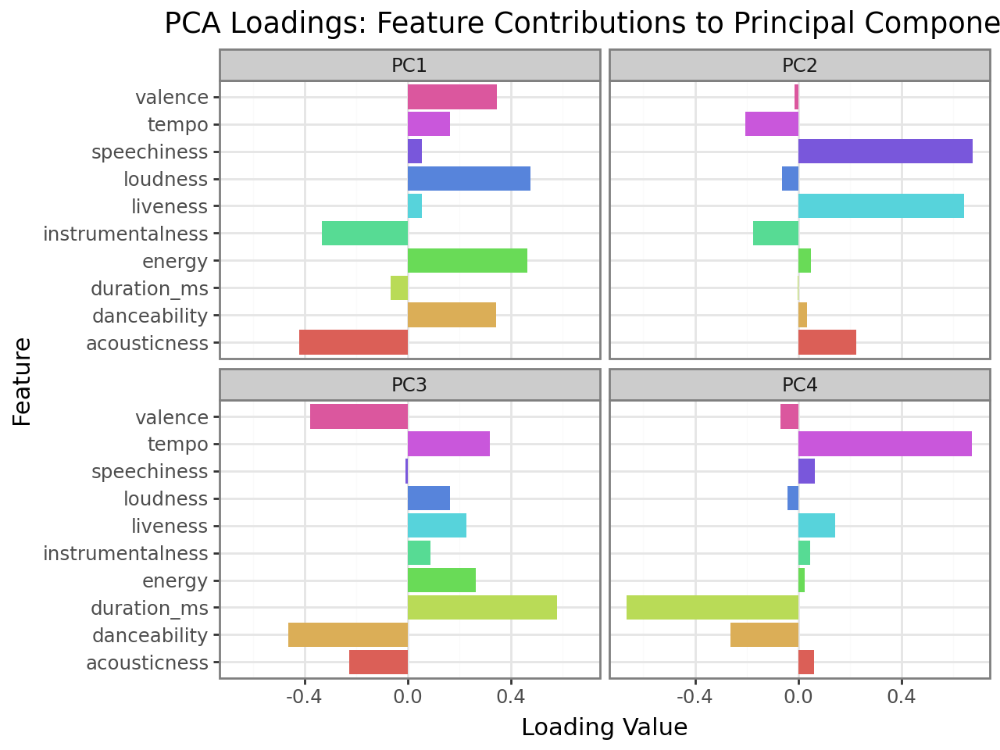

In [ ]:
from sklearn.cluster import KMeans

#This cell is used to show which features are mostly represented by each principal
#component and the results are used later to interpret clusters
feature_cols = ['acousticness', 'danceability', 'duration_ms', 'energy',
                'instrumentalness', 'liveness', 'loudness', 'speechiness',
                'tempo', 'valence', 'popularity']

features_tf = tidySpotifyTracks.select(feature_cols)
features_pd = features_tf.to_pandas()

X = features_pd.drop(columns=['popularity'])
y_popularity = features_pd['popularity']

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

pca_full = PCA()
pca_full.fit(X_scaled)

feature_names = X.columns.tolist()

#format loadings value
loadings = pca_full.components_[:4].T  # shape: (n_features, 4)
loadings_data = []
for i, feat in enumerate(feature_names):
    for pc_idx in range(4):
        loadings_data.append({
            'Feature': feat,
            'PC': f'PC{pc_idx + 1}',
            'Loading': loadings[i, pc_idx],
            'Abs_Loading': numpy.abs(loadings[i, pc_idx])
        })

loadings_tf = tidyframe(loadings_data)

# Visualize PCA loadings shows which features contribute most to each PC
loadings_plot = (
    ggplot(loadings_tf, aes(x='Feature', y='Loading', fill='Feature'))
    + geom_col()
    + facet_wrap('~PC', ncol=2)
    + coord_flip()
    + theme_bw()
    + labs(
        title='PCA Loadings: Feature Contributions to Principal Components',
        x='Feature',
        y='Loading Value'
    )
    + theme(legend_position='none')
)
loadings_plot

##PC 1 analysis:

Significant feature contributions to pc1 are high loudness, high energy, low instrumentalness, low acousticness and high danceability.

##PC 2 analysis:

Significant feature contributions to pc2 are low tempo, high speechiness, and high liveness.

##PC 3 analysis:

Significant feature contributions to pc3 are low valence, high duration_ms and low danceability.

##PC 4 Analysis:

Significant feature contributions to pc4 are high tempo and low duration_ms

/usr/local/lib/python3.12/dist-packages/tidypandas/tidy_utils.py:211: FutureWarning: RangeIndex.is_numeric is deprecated. Use pandas.api.types.is_any_real_numeric_dtype instead


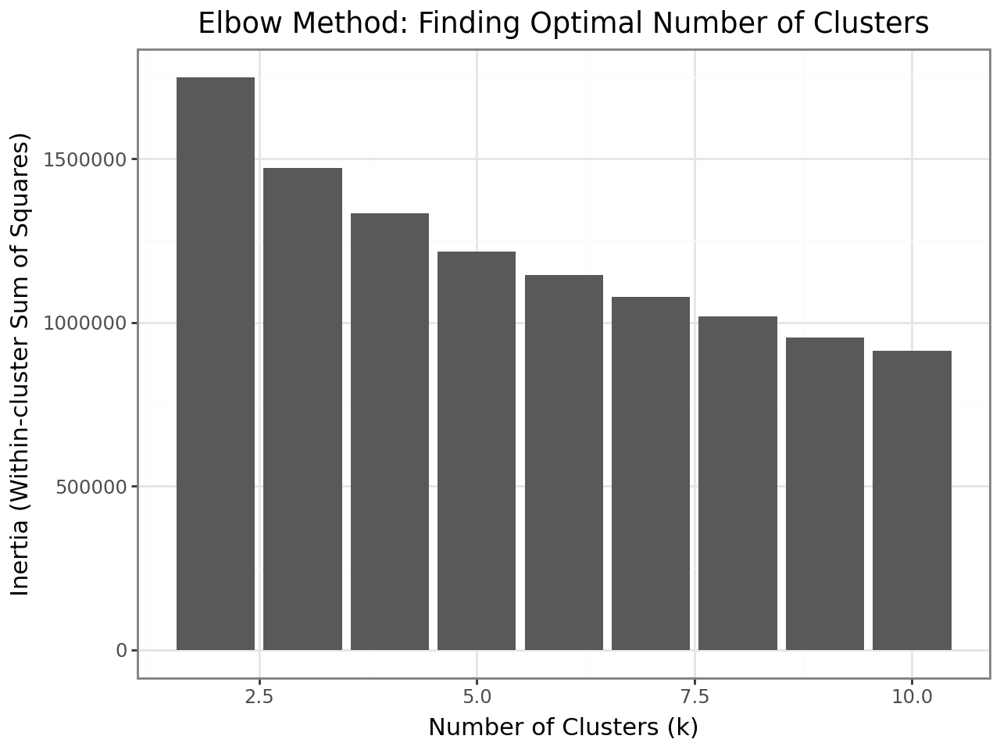

In [ ]:
# K-Means Clustering to discover natural groupings and relate to popularity

# First, find optimal number of clusters using elbow method
inertias = []
k_range = range(2, 11)
for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10) #set the seed for reproducible results
    kmeans.fit(X_scaled)
    inertias.append(kmeans.inertia_)

elbow_tf = tidyframe({
    'k': list(k_range),
    'inertia': inertias
})

elbow_plot = (
    ggplot(elbow_tf, aes(x='k', y='inertia'))
    + geom_col()
    + theme_bw()
    + labs(
        title='Elbow Method: Finding Optimal Number of Clusters',
        x='Number of Clusters (k)',
        y='Inertia (Within-cluster Sum of Squares)'
    )
)
elbow_plot

The elbow plot shows a gradual decline without a sharp bend, so the data doesn't form highly distinct clusters. I selected k=4 as a balance between showing meaningful groupings and avoiding over-segmentation, as this is where the declines begins to slow noticeably.

/usr/local/lib/python3.12/dist-packages/tidypandas/tidy_utils.py:211: FutureWarning: RangeIndex.is_numeric is deprecated. Use pandas.api.types.is_any_real_numeric_dtype instead


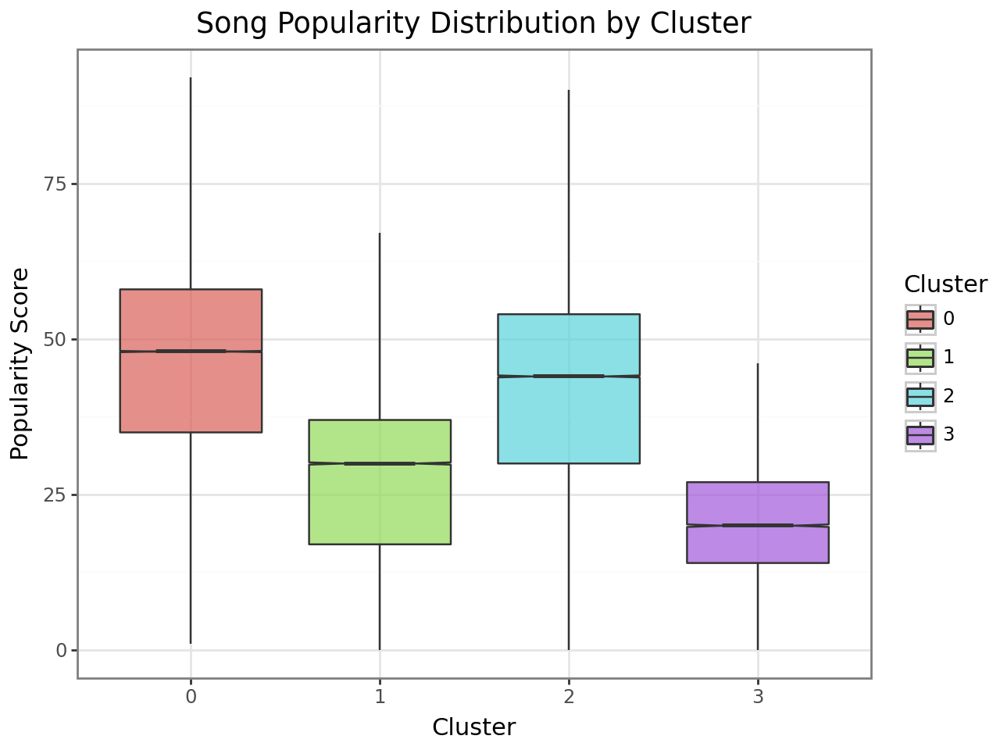

In [ ]:
# Apply K-Means with k=4 (based on elbow) and analyze clusters
kmeans_final = KMeans(n_clusters=4, random_state=42, n_init=10)
cluster_labels = kmeans_final.fit_predict(X_scaled)

# Add cluster labels and popularity to a tidyframe for analysis
cluster_analysis = features_pd.copy()
cluster_analysis['Cluster'] = cluster_labels
cluster_analysis['Cluster'] = cluster_analysis['Cluster'].astype(str)
cluster_tf = tidyframe(cluster_analysis)

# Visualize popularity distribution across clusters
popularity_cluster_plot = (
    ggplot(cluster_tf, aes(x='Cluster', y='popularity', fill='Cluster'))
    + geom_boxplot(alpha=0.7, outlier_shape=None, notch=True)
    + theme_bw()
    + labs(
        title='Song Popularity Distribution by Cluster',
        x='Cluster',
        y='Popularity Score'
    )
)
popularity_cluster_plot

Clusters 0 and 2 show much higher popularity than 1 and 3

In [ ]:
cluster_summary = (
    cluster_tf
    .summarize({
        'mean_popularity': (lambda x: x['popularity'].mean()),
        'mean_danceability': (lambda x: x['danceability'].mean()),
        'mean_energy': (lambda x: x['energy'].mean()),
        'mean_loudness': (lambda x: x['loudness'].mean()),
        'mean_instrumentalness': (lambda x: x['instrumentalness'].mean()),
        'mean_tempo': (lambda x: x['tempo'].mean()),
        'mean_valence': (lambda x: x['valence'].mean()),
        'mean_speechiness': (lambda x: x['speechiness'].mean()),
        'mean_liveness': (lambda x: x['liveness'].mean()),
        'mean_acousticness': (lambda x: x['acousticness'].mean()),
        'mean_duration_ms': (lambda x: x['duration_ms'].mean()),
        'count': (lambda x: len(x))
    }, by='Cluster')
)
cluster_summary



/usr/local/lib/python3.12/dist-packages/tidypandas/format.py:166: FutureWarning: Index.format is deprecated and will be removed in a future version. Convert using index.astype(str) or index.map(formatter) instead.


,Cluster,mean_popularity,mean_danceability,mean_energy,mean_loudness,mean_instrumentalness,mean_tempo,mean_valence,mean_speechiness,mean_liveness,mean_acousticness,mean_duration_ms,count
,<object>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<int64>
0,0,46.000678,0.615961,0.735163,-6.257914,0.068319,124.420413,0.554687,0.100905,0.207730,0.125471,232022.081248,135733
1,2,40.158006,0.547486,0.377727,-11.119864,0.084968,113.115605,0.386423,0.072159,0.172005,0.618929,225886.413433,56517
2,3,21.402507,0.561953,0.664221,-11.954493,0.001371,98.278085,0.414307,0.873818,0.729879,0.785865,243991.078543,10211
3,1,27.737146,0.288391,0.163888,-20.724869,0.674867,102.416333,0.149064,0.046527,0.154250,0.850458,263282.379395,30264


This summary provides great data and helps evaluate my original hypothesis. The data cluster with the highest popularity had the highest mean danceability, highest mean loudness (-6.257 is louder closer to 0), and highest mean tempo, all of which coincide with my original hypothesis. However I was proven wrong about the instrementalness. The one with the least instrumentalness (most vocals) actually had the lowest popularity, however the data with the most popularity had very low mean instrumentalness as well, and the 2nd least popularity had the highest instrumentalness. So it sort of coincides with my hypothesis but the outcome is not clear enough to say that more vocals and less instrumental leads to a more popular song. What this summary says, and it makes sense logically, is that you need a mix of vocals and instrumentalness, however you want  more vocals than instrumentalness for a more popular song.

Other significant observations is that a high liveness, acousticness, speechiness and duration will generally have lower popularity as well.


/usr/local/lib/python3.12/dist-packages/tidypandas/tidy_utils.py:211: FutureWarning: RangeIndex.is_numeric is deprecated. Use pandas.api.types.is_any_real_numeric_dtype instead


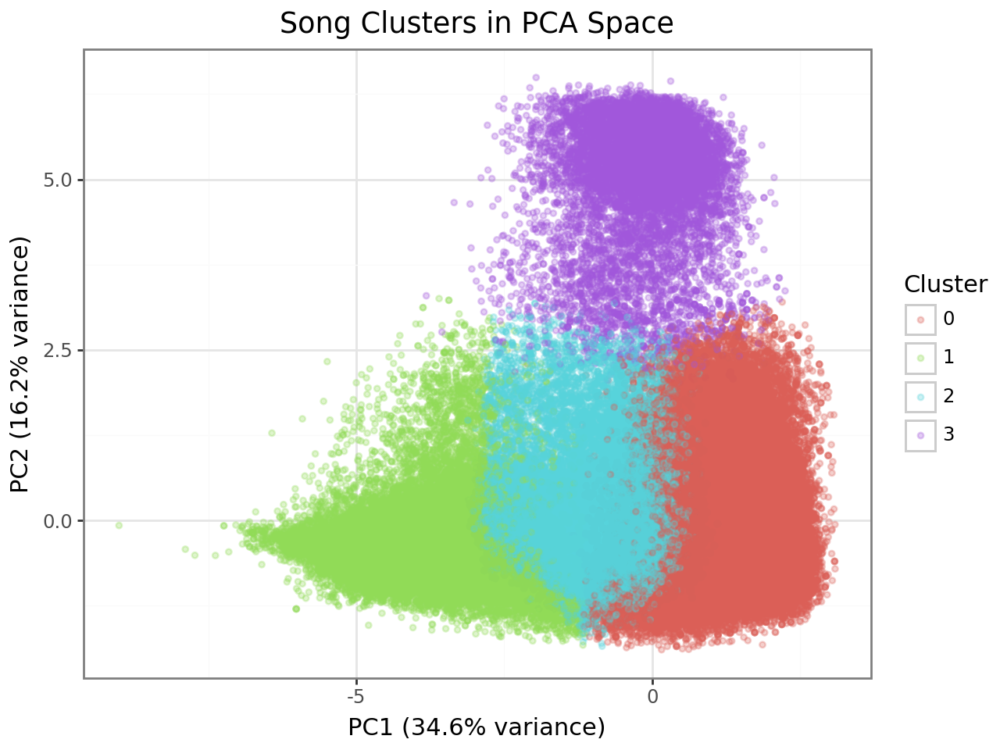

In [ ]:
# Project data onto 2 principal components for visualization
pca_2d = PCA(n_components=2)
X_pca = pca_2d.fit_transform(X_scaled)

# Create tidyframe with PCA coordinates, clusters, and popularity
pca_viz_data = {
    'PC1': X_pca[:, 0],
    'PC2': X_pca[:, 1],
    'Cluster': [str(c) for c in cluster_labels],
    'Popularity': y_popularity.values
}
pca_viz_tf = tidyframe(pca_viz_data)

# Visualize clusters in PCA space
pca_cluster_plot = (
    ggplot(pca_viz_tf, aes(x='PC1', y='PC2', color='Cluster'))
    + geom_point(alpha=0.3, size=1)
    + theme_bw()
    + labs(
        title='Song Clusters in PCA Space',
        x=f'PC1 ({pca_2d.explained_variance_ratio_[0]*100:.1f}% variance)',
        y=f'PC2 ({pca_2d.explained_variance_ratio_[1]*100:.1f}% variance)'
    )
)
pca_cluster_plot


Clusters to the right (according to pc loadings) are louder, energetic, vocal, not acoustic, and danceable. Clusters to the left are the opposite. Clusters towards the top are are slow, high speechiness and liveness.


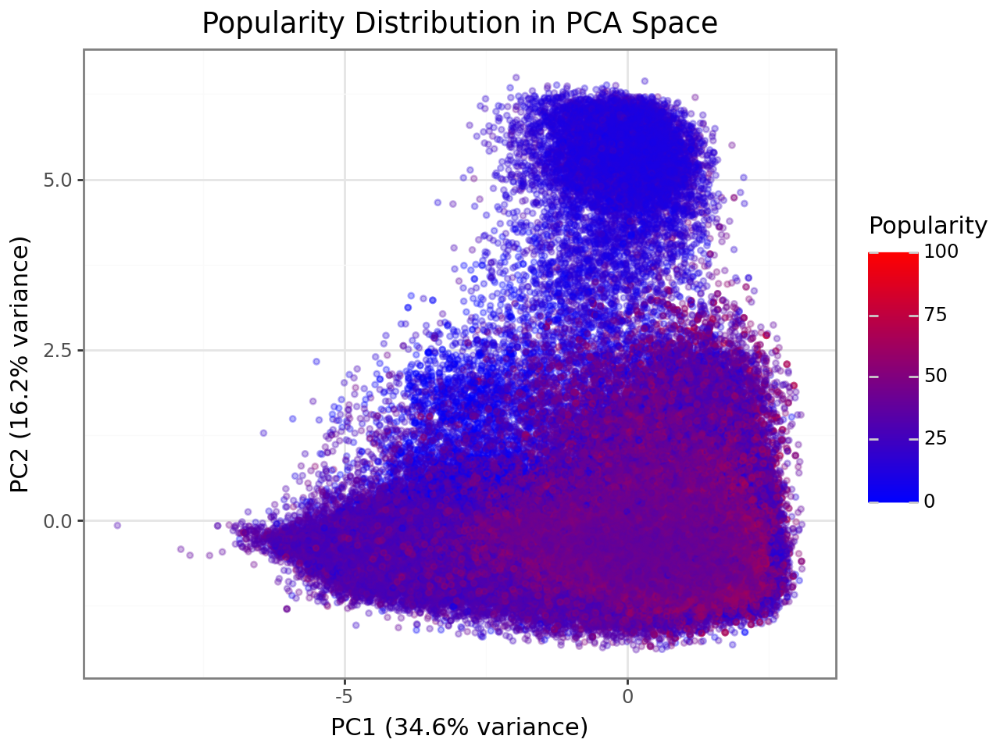

In [ ]:
# Visualize popularity gradient in PCA space
pca_popularity_plot = (
    ggplot(pca_viz_tf, aes(x='PC1', y='PC2', color='Popularity'))
    + geom_point(alpha=0.3, size=1)
    + scale_color_gradient(low='blue', high='red')
    + theme_bw()
    + labs(
        title='Popularity Distribution in PCA Space',
        x=f'PC1 ({pca_2d.explained_variance_ratio_[0]*100:.1f}% variance)',
        y=f'PC2 ({pca_2d.explained_variance_ratio_[1]*100:.1f}% variance)'
    )
)
pca_popularity_plot


So according to the loadings and the popularity gradient, songs to the bottom right are generally more popular. Therefore they are loud, energetic, vocal, not acoustic, and danceable. However there is more popular songs lower on the graph as well than at the top so that means songs that are higher tempo, less speechiness and less liveness are more likely to be popular as well since that is the opposite of the significant contributions to pc2.

/usr/local/lib/python3.12/dist-packages/tidypandas/tidy_utils.py:211: FutureWarning: RangeIndex.is_numeric is deprecated. Use pandas.api.types.is_any_real_numeric_dtype instead


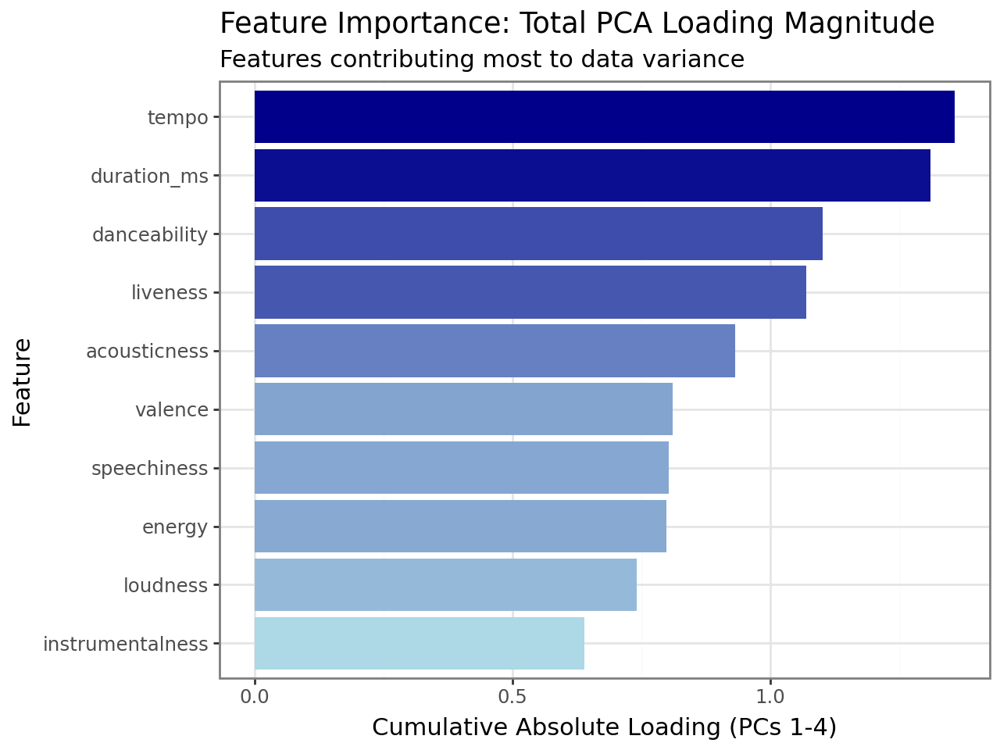

In [ ]:
# Feature Importance Summary: Rank features by total PCA loading magnitude
# across first 4 PCs (indicates overall contribution to data variance)
total_importance = numpy.abs(pca_full.components_[:4]).sum(axis=0)
importance_data = []
for i, feat in enumerate(feature_names):
    importance_data.append({
        'Feature': feat,
        'Total_Importance': total_importance[i]
    })

importance_tf = tidyframe(importance_data)
importance_tf_sorted = importance_tf.arrange([('Total_Importance', 'desc')])

importance_plot = (
    ggplot(importance_tf_sorted, aes(x='reorder(Feature, Total_Importance)', y='Total_Importance', fill='Total_Importance'))
    + geom_col()
    + coord_flip()
    + scale_fill_gradient(low='lightblue', high='darkblue')
    + theme_bw()
    + labs(
        title='Feature Importance: Total PCA Loading Magnitude',
        subtitle='Features contributing most to data variance',
        x='Feature',
        y='Cumulative Absolute Loading (PCs 1-4)'
    )
    + theme(legend_position='none')
)
importance_plot

So according to this model and visualization, the most important features to music popularity are tempo, duration_ms, danceability and liveness. High duration and livness lead to less popularity, while tempo and danceability lead to higher popularity. Instrumentals and loudness, according to this visualization, are not as important as I had originally guessed

#Below I decided to try and include the Categorical Features in my Model

I came to the conclusion that even when adding the categorical features the most important features ended up being danceability, energy and acousticness rather than what I discovered above


In [ ]:
# Prepare data with categorical features included
# Select numeric features
numeric_cols_cat = ['acousticness', 'danceability', 'duration_ms', 'energy',
                    'instrumentalness', 'liveness', 'loudness', 'speechiness',
                    'tempo', 'valence']

# Select categorical features to encode
cat_cols_to_encode = ['genre', 'mode', 'key', 'time_signature']

# Get the data using tidyframe, then convert for encoding
spotify_pd_cat = tidySpotifyTracks.to_pandas()

# One-hot encode categorical features (minimal pandas use for encoding)
encoded_cats = pandas.get_dummies(spotify_pd_cat[cat_cols_to_encode], drop_first=False)

# Combine numeric and encoded categorical features
X_with_cats = pandas.concat([spotify_pd_cat[numeric_cols_cat], encoded_cats], axis=1)
y_popularity_cat = spotify_pd_cat['popularity']

# Scale the features
scaler_cat = StandardScaler()
X_cat_scaled = scaler_cat.fit_transform(X_with_cats)

print(f"Total features after one-hot encoding: {X_with_cats.shape[1]}")
print(f"Original numeric features: {len(numeric_cols_cat)}")
print(f"Encoded categorical features: {encoded_cats.shape[1]}")

Total features after one-hot encoding: 56
Original numeric features: 10
Encoded categorical features: 46


/usr/local/lib/python3.12/dist-packages/tidypandas/tidy_utils.py:211: FutureWarning: RangeIndex.is_numeric is deprecated. Use pandas.api.types.is_any_real_numeric_dtype instead


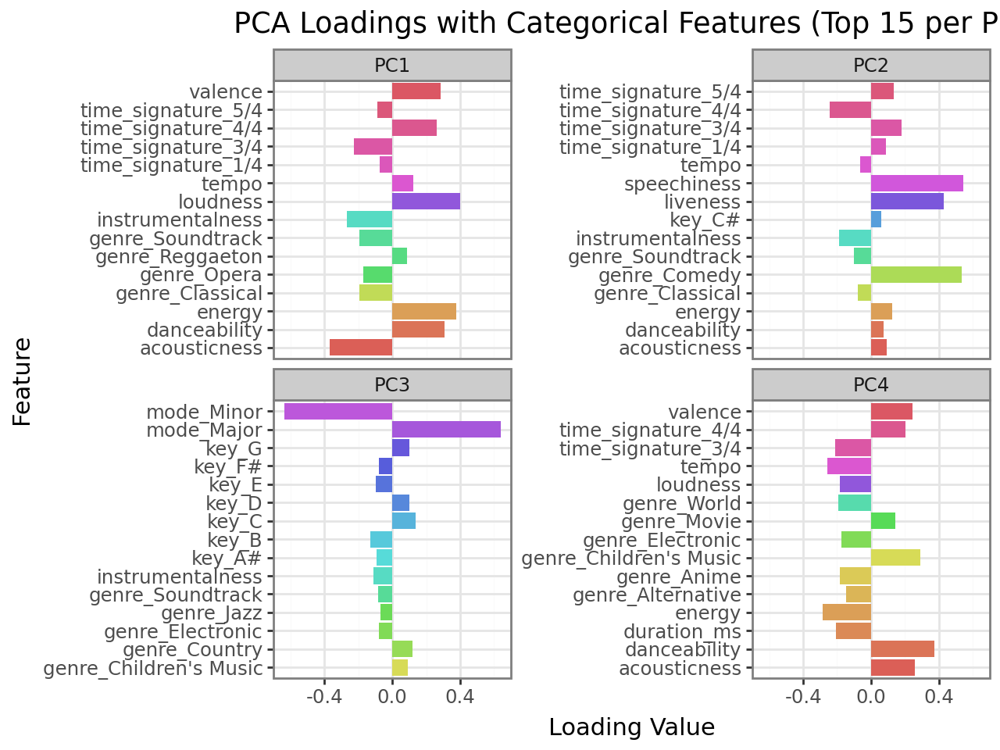

In [ ]:
# PCA on data with categorical features
pca_cat = PCA()
pca_cat.fit(X_cat_scaled)

# Get feature names for loadings analysis
feature_names_cat = X_with_cats.columns.tolist()

# Create loadings dataframe for first 4 PCs
loadings_cat = pca_cat.components_[:4].T
loadings_data_cat = []

# Only include top 15 features by absolute loading for readability
for pc_idx in range(4):
    pc_loadings = [(feat, loadings_cat[i, pc_idx]) for i, feat in enumerate(feature_names_cat)]
    pc_loadings_sorted = sorted(pc_loadings, key=lambda x: abs(x[1]), reverse=True)[:15]
    for feat, loading in pc_loadings_sorted:
        loadings_data_cat.append({
            'Feature': feat,
            'PC': f'PC{pc_idx + 1}',
            'Loading': loading
        })

loadings_cat_tf = tidyframe(loadings_data_cat)

# Visualize PCA loadings (top features only)
loadings_cat_plot = (
    ggplot(loadings_cat_tf, aes(x='Feature', y='Loading', fill='Feature'))
    + geom_col()
    + facet_wrap('~PC', ncol=2, scales='free_y')
    + coord_flip()
    + theme_bw()
    + labs(
        title='PCA Loadings with Categorical Features (Top 15 per PC)',
        x='Feature',
        y='Loading Value'
    )
    + theme(legend_position='none')
)
loadings_cat_plot

Adding the categorical values changed the contributors to each PC in a major way and added a lot of numerical values via the genres.

/usr/local/lib/python3.12/dist-packages/tidypandas/tidy_utils.py:211: FutureWarning: RangeIndex.is_numeric is deprecated. Use pandas.api.types.is_any_real_numeric_dtype instead


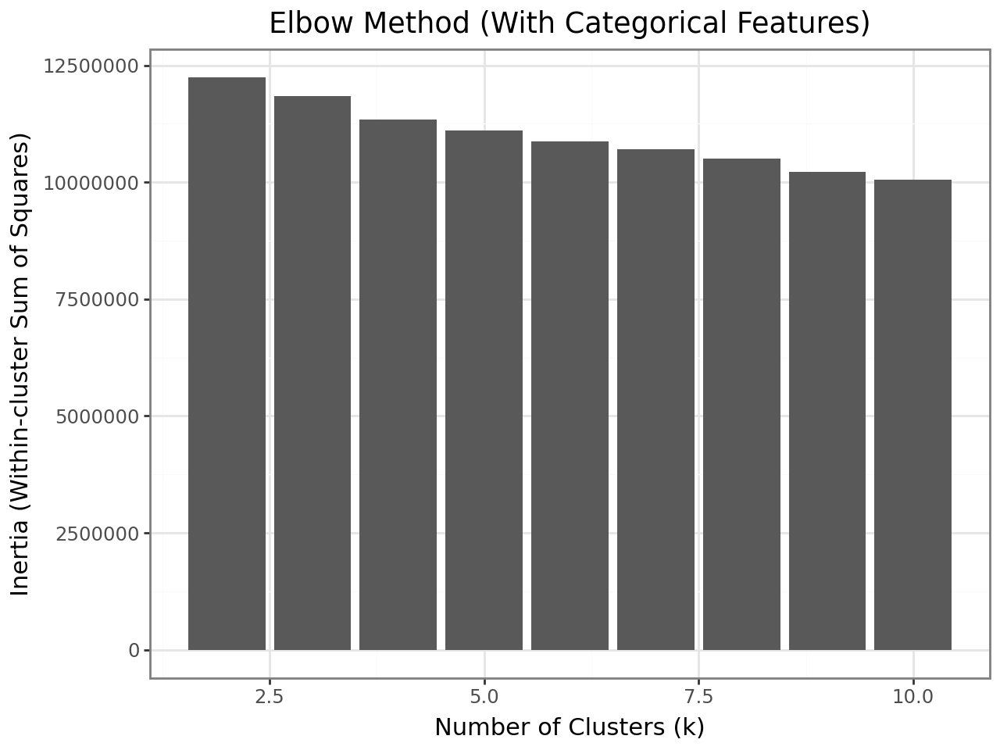

In [ ]:
# Elbow method for model with categorical features
inertias_cat = []
k_range_cat = range(2, 11)
for k in k_range_cat:
    kmeans_cat = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans_cat.fit(X_cat_scaled)
    inertias_cat.append(kmeans_cat.inertia_)

elbow_cat_tf = tidyframe({
    'k': list(k_range_cat),
    'inertia': inertias_cat
})

elbow_cat_plot = (
    ggplot(elbow_cat_tf, aes(x='k', y='inertia'))
    + geom_col()
    + theme_bw()
    + labs(
        title='Elbow Method (With Categorical Features)',
        x='Number of Clusters (k)',
        y='Inertia (Within-cluster Sum of Squares)'
    )
)
elbow_cat_plot


With a lot more features added, the drop off is a lot less steep

/usr/local/lib/python3.12/dist-packages/tidypandas/tidy_utils.py:211: FutureWarning: RangeIndex.is_numeric is deprecated. Use pandas.api.types.is_any_real_numeric_dtype instead


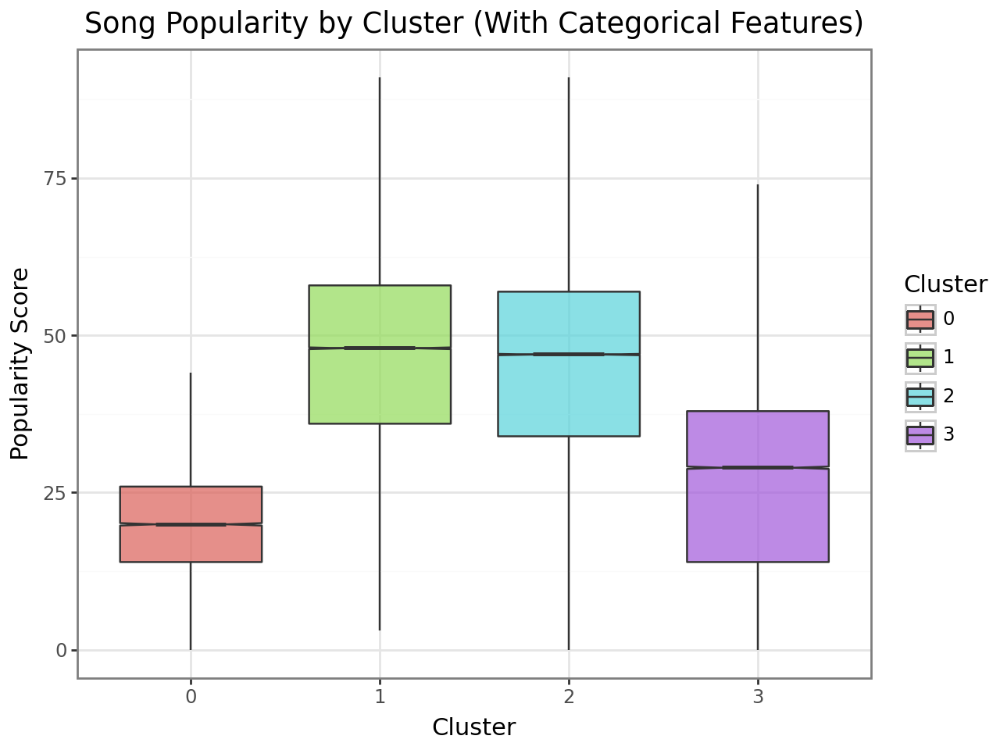

In [ ]:
# K-Means clustering with categorical features (k=4)
kmeans_cat_final = KMeans(n_clusters=4, random_state=42, n_init=10)
cluster_labels_cat = kmeans_cat_final.fit_predict(X_cat_scaled)

# Create tidyframe for cluster analysis
cluster_cat_data = spotify_pd_cat[numeric_cols_cat + ['popularity']].copy()
cluster_cat_data['Cluster'] = [str(c) for c in cluster_labels_cat]
cluster_cat_tf = tidyframe(cluster_cat_data)

# Popularity distribution by cluster
popularity_cat_plot = (
    ggplot(cluster_cat_tf, aes(x='Cluster', y='popularity', fill='Cluster'))
    + geom_boxplot(alpha=0.7, outlier_shape=None, notch=True)
    + theme_bw()
    + labs(
        title='Song Popularity by Cluster (With Categorical Features)',
        x='Cluster',
        y='Popularity Score'
    )
)
popularity_cat_plot

/usr/local/lib/python3.12/dist-packages/tidypandas/tidy_utils.py:211: FutureWarning: RangeIndex.is_numeric is deprecated. Use pandas.api.types.is_any_real_numeric_dtype instead


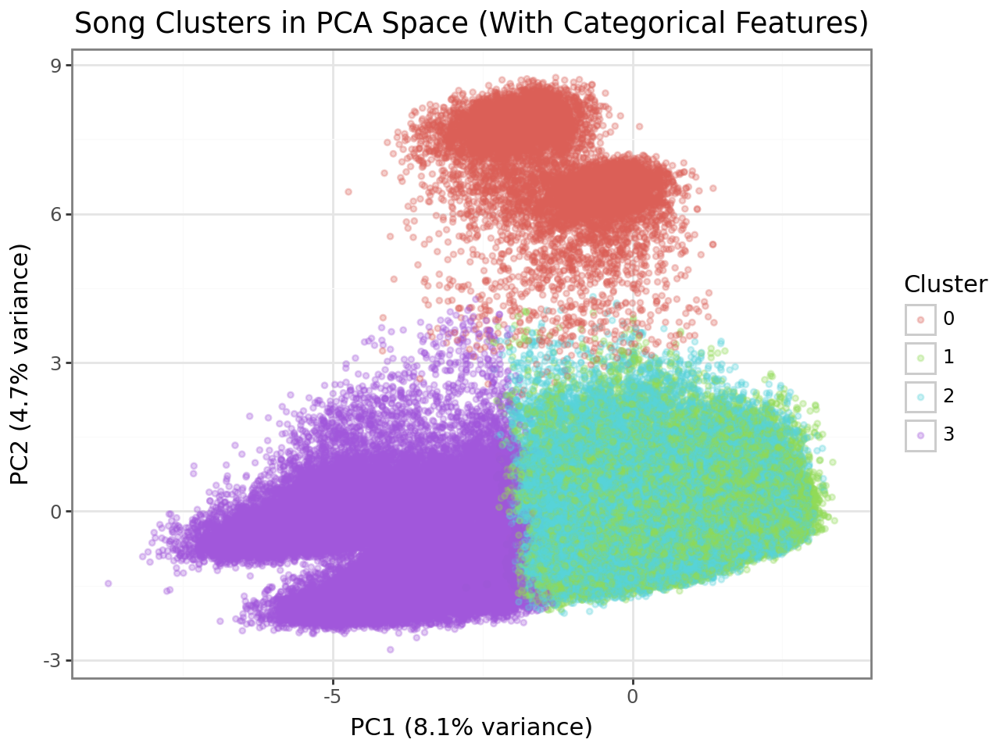

In [ ]:
# PCA 2D projection with categorical features
pca_2d_cat = PCA(n_components=2)
X_pca_cat = pca_2d_cat.fit_transform(X_cat_scaled)

# Create tidyframe for visualization
pca_cat_viz_data = {
    'PC1': X_pca_cat[:, 0],
    'PC2': X_pca_cat[:, 1],
    'Cluster': [str(c) for c in cluster_labels_cat],
    'Popularity': y_popularity_cat.values
}
pca_cat_viz_tf = tidyframe(pca_cat_viz_data)

# Visualize clusters in PCA space
pca_cat_cluster_plot = (
    ggplot(pca_cat_viz_tf, aes(x='PC1', y='PC2', color='Cluster'))
    + geom_point(alpha=0.3, size=1)
    + theme_bw()
    + labs(
        title='Song Clusters in PCA Space (With Categorical Features)',
        x=f'PC1 ({pca_2d_cat.explained_variance_ratio_[0]*100:.1f}% variance)',
        y=f'PC2 ({pca_2d_cat.explained_variance_ratio_[1]*100:.1f}% variance)'
    )
)
pca_cat_cluster_plot


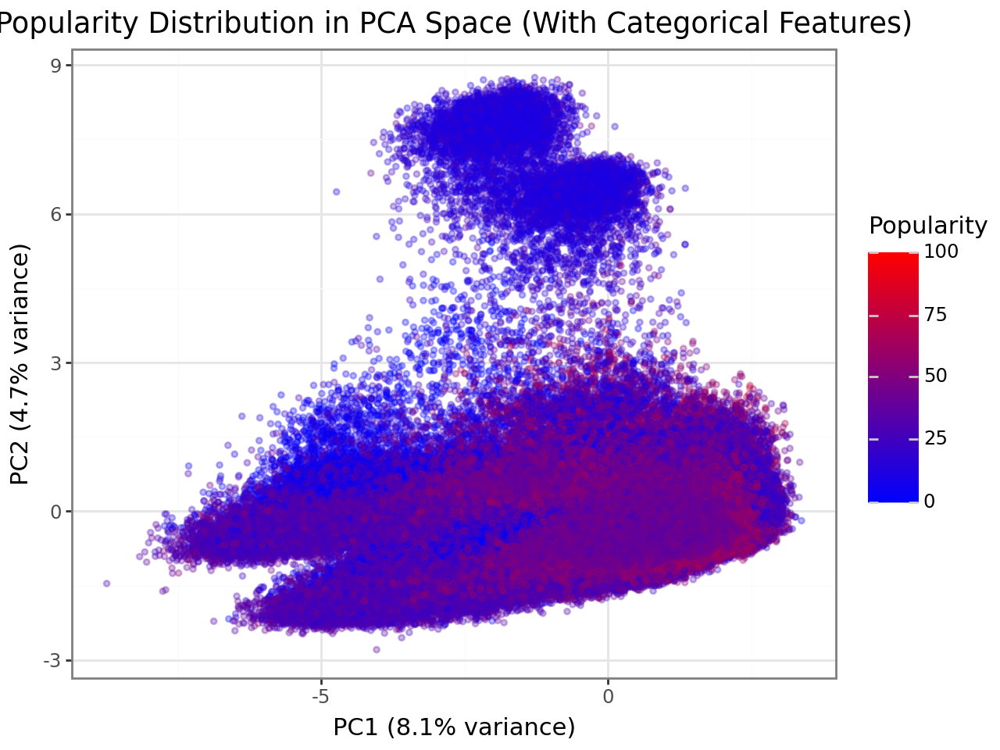

In [ ]:
# Popularity gradient in PCA space (with categorical features)
pca_cat_popularity_plot = (
    ggplot(pca_cat_viz_tf, aes(x='PC1', y='PC2', color='Popularity'))
    + geom_point(alpha=0.3, size=1)
    + scale_color_gradient(low='blue', high='red')
    + theme_bw()
    + labs(
        title='Popularity Distribution in PCA Space (With Categorical Features)',
        x=f'PC1 ({pca_2d_cat.explained_variance_ratio_[0]*100:.1f}% variance)',
        y=f'PC2 ({pca_2d_cat.explained_variance_ratio_[1]*100:.1f}% variance)'
    )
)
pca_cat_popularity_plot


/usr/local/lib/python3.12/dist-packages/tidypandas/tidy_utils.py:211: FutureWarning: RangeIndex.is_numeric is deprecated. Use pandas.api.types.is_any_real_numeric_dtype instead


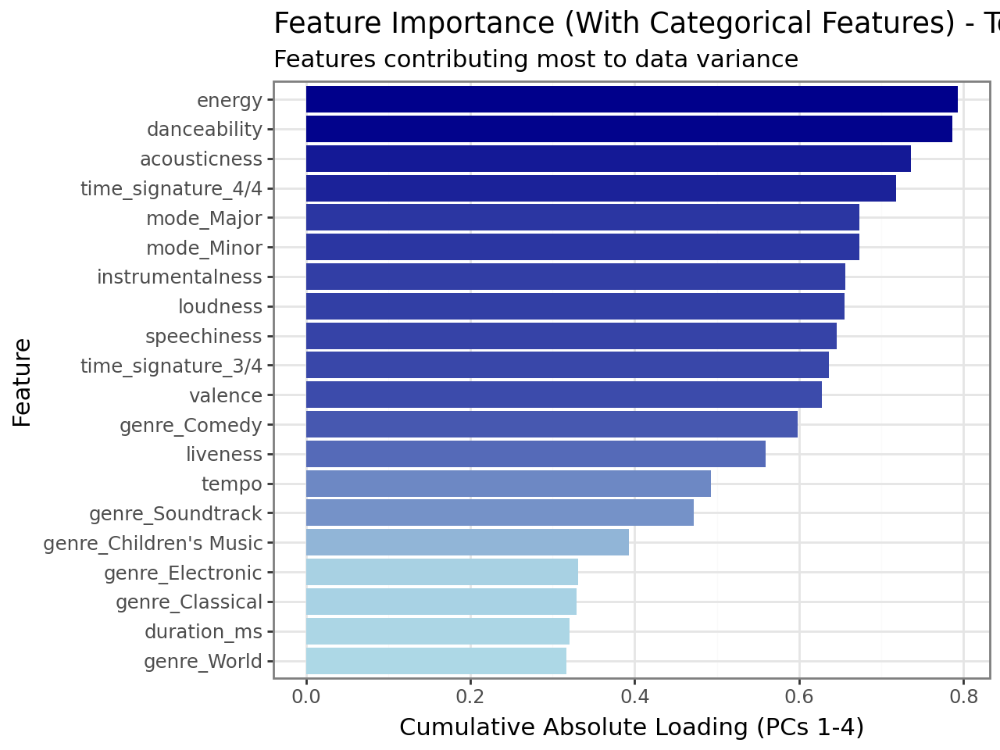

In [ ]:
# Feature Importance Summary for Categorical Model
# Rank features by total PCA loading magnitude across first 4 PCs
total_importance_cat = numpy.abs(pca_cat.components_[:4]).sum(axis=0)
importance_data_cat = []
for i, feat in enumerate(feature_names_cat):
    importance_data_cat.append({
        'Feature': feat,
        'Total_Importance': total_importance_cat[i]
    })

importance_cat_tf = tidyframe(importance_data_cat)
importance_cat_tf_sorted = importance_cat_tf.arrange([('Total_Importance', 'desc')])

# Show top 20 features for readability (since there are many encoded features)
top_20_features = importance_cat_tf_sorted.head(20)

importance_cat_plot = (
    ggplot(top_20_features, aes(x='reorder(Feature, Total_Importance)', y='Total_Importance', fill='Total_Importance'))
    + geom_col()
    + coord_flip()
    + scale_fill_gradient(low='lightblue', high='darkblue')
    + theme_bw()
    + labs(
        title='Feature Importance (W/ Categorical Features) Top 20',
        subtitle='Features contributing most to data variance',
        x='Feature',
        y='Cumulative Absolute Loading (PCs 1-4)'
    )
    + theme(legend_position='none')
)
importance_cat_plot

**5. [10%]** Reflect upon your findings from this assignment and articulate the strengths and weaknesses of your approach. Discuss future directions that could be followed up from your study.

First and fore most I think this assignment was a great way for us to explore everything we have learned. The strengths in my approach are mostly in the unsupervised learning. I was able to use all the numeric features to find the most important of them. My weakness in the supervised approach that I did not realize till later was not including the categorical features that could absolutely contribute to popularity. I mentioned once that the genre of 'pop' music followed by 'rap' were the most popular. I did not delve into that as much as I could have. However, I was able to take a look in the unsupervised version and came to the conclusion that song attributes are still more important than belonging to a certain genre, energy danceability, and acousticness were still the most important features according to the loading visualization.

**Exporting this Python notebook to HTML.** We have reviewed in class how to export a Python notebook to HTML. However, for a reminder, you can see the following [answer](https://stackoverflow.com/questions/53460051/convert-ipynb-notebook-to-html-in-google-colab) on Stack Overflow as a reminder. You can use the Python notebook cell below to paste in the code to export to HTML.

In [ ]:
%%shell
jupyter nbconvert --to html "/content/Assignment8 (1).ipynb"

[NbConvertApp] Converting notebook /content/Assignment8 (1).ipynb to html
[NbConvertApp] WARNING | Alternative text is missing on 26 image(s).
[NbConvertApp] Writing 13870822 bytes to /content/Assignment8 (1).html
